# Building a Twitter Streamer Copy

## Created this copy to try some new things
Later decided to join them
* Apply Twitter's StreamListener to gather data on a continuous basis
* Store data as a csv and save the file

## Imports

In [1]:
import tweepy as tw
import json
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import time
import pickle
import re

from sklearn.feature_extraction.text import CountVectorizer
from datetime import datetime
from pprint import pprint
from pymongo import MongoClient

%matplotlib inline

## Load Twitter Permissions and connect to Twitter using Tweepy

In [2]:
# Use 'with' to open file since it will automatically close the file
with open('/Users/shirlwilliams/Documents/.permission files/twitter_perms.json') as f:
    d = json.load(f)

In [8]:
# Create the auth
auth = tw.OAuthHandler(consumer_key=d['consumer_key'], consumer_secret=d['consumer_secret'])
auth.set_access_token(key=d['access_token'], secret=d['access_token_secret'])

In [9]:
# Create the API by passing in the auth
api = tw.API(auth_handler=auth)

In [22]:
# # Check the connection with a basic search
# for tweet in api.search('#COVID'):
#     print(tweet._json)

## Run mongod in terminal and connect to it using pymongo.MongoClient

In [2]:
# Connect
client = MongoClient(port=27017, host='localhost')

In [3]:
# 
tweets1 = client['tweets1']

In [4]:
# Mongo is built on json formatting so everything reads like a dictionary
covid_tweets1 = tweets1["covid"]

In [5]:
# New collection called covid
covid1 = covid_tweets1['covid1']

In [18]:
# We don't see the collection since a collection needs a document in 
# order to get built
#covid_tweets.list_collection_names()

# Build a StreamListener to obtain tweets


In [36]:
# Child class of StreamListener class
class MyStreamListener(tw.StreamListener):  
    
    def on_status(self, status):  
        covid_tweets1.insert_one(status._json)
        print('inserted tweet, now db has {} tweets'.format(covid_tweets1.count_documents(filter={})))
        
        # if retweeted_status attribute exists, flag this a retweet
        is_retweet = hasattr(status, 'retweeted_status')

        # check to see if text has been truncated
        if hasattr(status, 'extended_tweet'):
            text = status.extended_tweet['full_text']
        else:
            text = status.text

        # check if this is a quote tweet
        is_quote = hasattr(status, 'quoted_status')
        quoted_text = ''
        if is_quote:
            # check if quoted tweet's test has been truncated before recording
            if hasattr(status.quoted_status, 'extended_tweet'):
                quoted_text = status.quoted_status.extended_tweet['full_text']
            else:
                quoted_text = status.quoted_status.text

        # remove characters that might cause problems with scv encoding
        remove_characters = [',', '\n']
        for c in remove_characters:
            text.replace(c, " ")

        with open('out.csv', 'a', encoding='utf-8') as f:
            f.write('%s,%s,%s,%s,%s,%s,%s,%s,%s\n' % (status.created_at,status.user.screen_name,is_retweet,is_quote,text,quoted_text,status.geo,status.place,status.lang))
    
        
        
    def on_error(self, status_code):
        if status_code == 420:
            print('Encountered and error (', status_code, ')')
            return False

In [37]:
# This is the listener
myStreamListener = MyStreamListener()
myStream = tw.Stream(auth = api.auth, listener=myStreamListener, tweet_mode='extended')

In [38]:
# Filter
myStream.filter(track=['covid', '#covid', 'shelter', 'COVID', '#COVID', 'pandemic'])

inserted tweet, now db has 88700 tweets
inserted tweet, now db has 88701 tweets
inserted tweet, now db has 88702 tweets
inserted tweet, now db has 88703 tweets
inserted tweet, now db has 88704 tweets
inserted tweet, now db has 88705 tweets
inserted tweet, now db has 88706 tweets
inserted tweet, now db has 88707 tweets
inserted tweet, now db has 88708 tweets
inserted tweet, now db has 88709 tweets
inserted tweet, now db has 88710 tweets
inserted tweet, now db has 88711 tweets
inserted tweet, now db has 88712 tweets
inserted tweet, now db has 88713 tweets
inserted tweet, now db has 88714 tweets
inserted tweet, now db has 88715 tweets
inserted tweet, now db has 88716 tweets
inserted tweet, now db has 88717 tweets
inserted tweet, now db has 88718 tweets
inserted tweet, now db has 88719 tweets
inserted tweet, now db has 88720 tweets
inserted tweet, now db has 88721 tweets
inserted tweet, now db has 88722 tweets
inserted tweet, now db has 88723 tweets
inserted tweet, now db has 88724 tweets


inserted tweet, now db has 88908 tweets
inserted tweet, now db has 88909 tweets
inserted tweet, now db has 88910 tweets
inserted tweet, now db has 88911 tweets
inserted tweet, now db has 88912 tweets
inserted tweet, now db has 88913 tweets
inserted tweet, now db has 88914 tweets
inserted tweet, now db has 88915 tweets
inserted tweet, now db has 88916 tweets
inserted tweet, now db has 88917 tweets
inserted tweet, now db has 88918 tweets
inserted tweet, now db has 88919 tweets
inserted tweet, now db has 88920 tweets
inserted tweet, now db has 88921 tweets
inserted tweet, now db has 88922 tweets
inserted tweet, now db has 88923 tweets
inserted tweet, now db has 88924 tweets
inserted tweet, now db has 88925 tweets
inserted tweet, now db has 88926 tweets
inserted tweet, now db has 88927 tweets
inserted tweet, now db has 88928 tweets
inserted tweet, now db has 88929 tweets
inserted tweet, now db has 88930 tweets
inserted tweet, now db has 88931 tweets
inserted tweet, now db has 88932 tweets


inserted tweet, now db has 89117 tweets
inserted tweet, now db has 89118 tweets
inserted tweet, now db has 89119 tweets
inserted tweet, now db has 89120 tweets
inserted tweet, now db has 89121 tweets
inserted tweet, now db has 89122 tweets
inserted tweet, now db has 89123 tweets
inserted tweet, now db has 89124 tweets
inserted tweet, now db has 89125 tweets
inserted tweet, now db has 89126 tweets
inserted tweet, now db has 89127 tweets
inserted tweet, now db has 89128 tweets
inserted tweet, now db has 89129 tweets
inserted tweet, now db has 89130 tweets
inserted tweet, now db has 89131 tweets
inserted tweet, now db has 89132 tweets
inserted tweet, now db has 89133 tweets
inserted tweet, now db has 89134 tweets
inserted tweet, now db has 89135 tweets
inserted tweet, now db has 89136 tweets
inserted tweet, now db has 89137 tweets
inserted tweet, now db has 89138 tweets
inserted tweet, now db has 89139 tweets
inserted tweet, now db has 89140 tweets
inserted tweet, now db has 89141 tweets


inserted tweet, now db has 89327 tweets
inserted tweet, now db has 89328 tweets
inserted tweet, now db has 89329 tweets
inserted tweet, now db has 89330 tweets
inserted tweet, now db has 89331 tweets
inserted tweet, now db has 89332 tweets
inserted tweet, now db has 89333 tweets
inserted tweet, now db has 89334 tweets
inserted tweet, now db has 89335 tweets
inserted tweet, now db has 89336 tweets
inserted tweet, now db has 89337 tweets
inserted tweet, now db has 89338 tweets
inserted tweet, now db has 89339 tweets
inserted tweet, now db has 89340 tweets
inserted tweet, now db has 89341 tweets
inserted tweet, now db has 89342 tweets
inserted tweet, now db has 89343 tweets
inserted tweet, now db has 89344 tweets
inserted tweet, now db has 89345 tweets
inserted tweet, now db has 89346 tweets
inserted tweet, now db has 89347 tweets
inserted tweet, now db has 89348 tweets
inserted tweet, now db has 89349 tweets
inserted tweet, now db has 89350 tweets
inserted tweet, now db has 89351 tweets


inserted tweet, now db has 89537 tweets
inserted tweet, now db has 89538 tweets
inserted tweet, now db has 89539 tweets
inserted tweet, now db has 89540 tweets
inserted tweet, now db has 89541 tweets
inserted tweet, now db has 89542 tweets
inserted tweet, now db has 89543 tweets
inserted tweet, now db has 89544 tweets
inserted tweet, now db has 89545 tweets
inserted tweet, now db has 89546 tweets
inserted tweet, now db has 89547 tweets
inserted tweet, now db has 89548 tweets
inserted tweet, now db has 89549 tweets
inserted tweet, now db has 89550 tweets
inserted tweet, now db has 89551 tweets
inserted tweet, now db has 89552 tweets
inserted tweet, now db has 89553 tweets
inserted tweet, now db has 89554 tweets
inserted tweet, now db has 89555 tweets
inserted tweet, now db has 89556 tweets
inserted tweet, now db has 89557 tweets
inserted tweet, now db has 89558 tweets
inserted tweet, now db has 89559 tweets
inserted tweet, now db has 89560 tweets
inserted tweet, now db has 89561 tweets


inserted tweet, now db has 89743 tweets
inserted tweet, now db has 89744 tweets
inserted tweet, now db has 89745 tweets
inserted tweet, now db has 89746 tweets
inserted tweet, now db has 89747 tweets
inserted tweet, now db has 89748 tweets
inserted tweet, now db has 89749 tweets
inserted tweet, now db has 89750 tweets
inserted tweet, now db has 89751 tweets
inserted tweet, now db has 89752 tweets
inserted tweet, now db has 89753 tweets
inserted tweet, now db has 89754 tweets
inserted tweet, now db has 89755 tweets
inserted tweet, now db has 89756 tweets
inserted tweet, now db has 89757 tweets
inserted tweet, now db has 89758 tweets
inserted tweet, now db has 89759 tweets
inserted tweet, now db has 89760 tweets
inserted tweet, now db has 89761 tweets
inserted tweet, now db has 89762 tweets
inserted tweet, now db has 89763 tweets
inserted tweet, now db has 89764 tweets
inserted tweet, now db has 89765 tweets
inserted tweet, now db has 89766 tweets
inserted tweet, now db has 89767 tweets


inserted tweet, now db has 89952 tweets
inserted tweet, now db has 89953 tweets
inserted tweet, now db has 89954 tweets
inserted tweet, now db has 89955 tweets
inserted tweet, now db has 89956 tweets
inserted tweet, now db has 89957 tweets
inserted tweet, now db has 89958 tweets
inserted tweet, now db has 89959 tweets
inserted tweet, now db has 89960 tweets
inserted tweet, now db has 89961 tweets
inserted tweet, now db has 89962 tweets
inserted tweet, now db has 89963 tweets
inserted tweet, now db has 89964 tweets
inserted tweet, now db has 89965 tweets
inserted tweet, now db has 89966 tweets
inserted tweet, now db has 89967 tweets
inserted tweet, now db has 89968 tweets
inserted tweet, now db has 89969 tweets
inserted tweet, now db has 89970 tweets
inserted tweet, now db has 89971 tweets
inserted tweet, now db has 89972 tweets
inserted tweet, now db has 89973 tweets
inserted tweet, now db has 89974 tweets
inserted tweet, now db has 89975 tweets
inserted tweet, now db has 89976 tweets


inserted tweet, now db has 90160 tweets
inserted tweet, now db has 90161 tweets
inserted tweet, now db has 90162 tweets
inserted tweet, now db has 90163 tweets
inserted tweet, now db has 90164 tweets
inserted tweet, now db has 90165 tweets
inserted tweet, now db has 90166 tweets
inserted tweet, now db has 90167 tweets
inserted tweet, now db has 90168 tweets
inserted tweet, now db has 90169 tweets
inserted tweet, now db has 90170 tweets
inserted tweet, now db has 90171 tweets
inserted tweet, now db has 90172 tweets
inserted tweet, now db has 90173 tweets
inserted tweet, now db has 90174 tweets
inserted tweet, now db has 90175 tweets
inserted tweet, now db has 90176 tweets
inserted tweet, now db has 90177 tweets
inserted tweet, now db has 90178 tweets
inserted tweet, now db has 90179 tweets
inserted tweet, now db has 90180 tweets
inserted tweet, now db has 90181 tweets
inserted tweet, now db has 90182 tweets
inserted tweet, now db has 90183 tweets
inserted tweet, now db has 90184 tweets


inserted tweet, now db has 90367 tweets
inserted tweet, now db has 90368 tweets
inserted tweet, now db has 90369 tweets
inserted tweet, now db has 90370 tweets
inserted tweet, now db has 90371 tweets
inserted tweet, now db has 90372 tweets
inserted tweet, now db has 90373 tweets
inserted tweet, now db has 90374 tweets
inserted tweet, now db has 90375 tweets
inserted tweet, now db has 90376 tweets
inserted tweet, now db has 90377 tweets
inserted tweet, now db has 90378 tweets
inserted tweet, now db has 90379 tweets
inserted tweet, now db has 90380 tweets
inserted tweet, now db has 90381 tweets
inserted tweet, now db has 90382 tweets
inserted tweet, now db has 90383 tweets
inserted tweet, now db has 90384 tweets
inserted tweet, now db has 90385 tweets
inserted tweet, now db has 90386 tweets
inserted tweet, now db has 90387 tweets
inserted tweet, now db has 90388 tweets
inserted tweet, now db has 90389 tweets
inserted tweet, now db has 90390 tweets
inserted tweet, now db has 90391 tweets


inserted tweet, now db has 90575 tweets
inserted tweet, now db has 90576 tweets
inserted tweet, now db has 90577 tweets
inserted tweet, now db has 90578 tweets
inserted tweet, now db has 90579 tweets
inserted tweet, now db has 90580 tweets
inserted tweet, now db has 90581 tweets
inserted tweet, now db has 90582 tweets
inserted tweet, now db has 90583 tweets
inserted tweet, now db has 90584 tweets
inserted tweet, now db has 90585 tweets
inserted tweet, now db has 90586 tweets
inserted tweet, now db has 90587 tweets
inserted tweet, now db has 90588 tweets
inserted tweet, now db has 90589 tweets
inserted tweet, now db has 90590 tweets
inserted tweet, now db has 90591 tweets
inserted tweet, now db has 90592 tweets
inserted tweet, now db has 90593 tweets
inserted tweet, now db has 90594 tweets
inserted tweet, now db has 90595 tweets
inserted tweet, now db has 90596 tweets
inserted tweet, now db has 90597 tweets
inserted tweet, now db has 90598 tweets
inserted tweet, now db has 90599 tweets


inserted tweet, now db has 90783 tweets
inserted tweet, now db has 90784 tweets
inserted tweet, now db has 90785 tweets
inserted tweet, now db has 90786 tweets
inserted tweet, now db has 90787 tweets
inserted tweet, now db has 90788 tweets
inserted tweet, now db has 90789 tweets
inserted tweet, now db has 90790 tweets
inserted tweet, now db has 90791 tweets
inserted tweet, now db has 90792 tweets
inserted tweet, now db has 90793 tweets
inserted tweet, now db has 90794 tweets
inserted tweet, now db has 90795 tweets
inserted tweet, now db has 90796 tweets
inserted tweet, now db has 90797 tweets
inserted tweet, now db has 90798 tweets
inserted tweet, now db has 90799 tweets
inserted tweet, now db has 90800 tweets
inserted tweet, now db has 90801 tweets
inserted tweet, now db has 90802 tweets
inserted tweet, now db has 90803 tweets
inserted tweet, now db has 90804 tweets
inserted tweet, now db has 90805 tweets
inserted tweet, now db has 90806 tweets
inserted tweet, now db has 90807 tweets


inserted tweet, now db has 90991 tweets
inserted tweet, now db has 90992 tweets
inserted tweet, now db has 90993 tweets
inserted tweet, now db has 90994 tweets
inserted tweet, now db has 90995 tweets
inserted tweet, now db has 90996 tweets
inserted tweet, now db has 90997 tweets
inserted tweet, now db has 90998 tweets
inserted tweet, now db has 90999 tweets
inserted tweet, now db has 91000 tweets
inserted tweet, now db has 91001 tweets
inserted tweet, now db has 91002 tweets
inserted tweet, now db has 91003 tweets
inserted tweet, now db has 91004 tweets
inserted tweet, now db has 91005 tweets
inserted tweet, now db has 91006 tweets
inserted tweet, now db has 91007 tweets
inserted tweet, now db has 91008 tweets
inserted tweet, now db has 91009 tweets
inserted tweet, now db has 91010 tweets
inserted tweet, now db has 91011 tweets
inserted tweet, now db has 91012 tweets
inserted tweet, now db has 91013 tweets
inserted tweet, now db has 91014 tweets
inserted tweet, now db has 91015 tweets


inserted tweet, now db has 91199 tweets
inserted tweet, now db has 91200 tweets
inserted tweet, now db has 91201 tweets
inserted tweet, now db has 91202 tweets
inserted tweet, now db has 91203 tweets
inserted tweet, now db has 91204 tweets
inserted tweet, now db has 91205 tweets
inserted tweet, now db has 91206 tweets
inserted tweet, now db has 91207 tweets
inserted tweet, now db has 91208 tweets
inserted tweet, now db has 91209 tweets
inserted tweet, now db has 91210 tweets
inserted tweet, now db has 91211 tweets
inserted tweet, now db has 91212 tweets
inserted tweet, now db has 91213 tweets
inserted tweet, now db has 91214 tweets
inserted tweet, now db has 91215 tweets
inserted tweet, now db has 91216 tweets
inserted tweet, now db has 91217 tweets
inserted tweet, now db has 91218 tweets
inserted tweet, now db has 91219 tweets
inserted tweet, now db has 91220 tweets
inserted tweet, now db has 91221 tweets
inserted tweet, now db has 91222 tweets
inserted tweet, now db has 91223 tweets


inserted tweet, now db has 91407 tweets
inserted tweet, now db has 91408 tweets
inserted tweet, now db has 91409 tweets
inserted tweet, now db has 91410 tweets
inserted tweet, now db has 91411 tweets
inserted tweet, now db has 91412 tweets
inserted tweet, now db has 91413 tweets
inserted tweet, now db has 91414 tweets
inserted tweet, now db has 91415 tweets
inserted tweet, now db has 91416 tweets
inserted tweet, now db has 91417 tweets
inserted tweet, now db has 91418 tweets
inserted tweet, now db has 91419 tweets
inserted tweet, now db has 91420 tweets
inserted tweet, now db has 91421 tweets
inserted tweet, now db has 91422 tweets
inserted tweet, now db has 91423 tweets
inserted tweet, now db has 91424 tweets
inserted tweet, now db has 91425 tweets
inserted tweet, now db has 91426 tweets
inserted tweet, now db has 91427 tweets
inserted tweet, now db has 91428 tweets
inserted tweet, now db has 91429 tweets
inserted tweet, now db has 91430 tweets
inserted tweet, now db has 91431 tweets


inserted tweet, now db has 91615 tweets
inserted tweet, now db has 91616 tweets
inserted tweet, now db has 91617 tweets
inserted tweet, now db has 91618 tweets
inserted tweet, now db has 91619 tweets
inserted tweet, now db has 91620 tweets
inserted tweet, now db has 91621 tweets
inserted tweet, now db has 91622 tweets
inserted tweet, now db has 91623 tweets
inserted tweet, now db has 91624 tweets
inserted tweet, now db has 91625 tweets
inserted tweet, now db has 91626 tweets
inserted tweet, now db has 91627 tweets
inserted tweet, now db has 91628 tweets
inserted tweet, now db has 91629 tweets
inserted tweet, now db has 91630 tweets
inserted tweet, now db has 91631 tweets
inserted tweet, now db has 91632 tweets
inserted tweet, now db has 91633 tweets
inserted tweet, now db has 91634 tweets
inserted tweet, now db has 91635 tweets
inserted tweet, now db has 91636 tweets
inserted tweet, now db has 91637 tweets
inserted tweet, now db has 91638 tweets
inserted tweet, now db has 91639 tweets


inserted tweet, now db has 91822 tweets
inserted tweet, now db has 91823 tweets
inserted tweet, now db has 91824 tweets
inserted tweet, now db has 91825 tweets
inserted tweet, now db has 91826 tweets
inserted tweet, now db has 91827 tweets
inserted tweet, now db has 91828 tweets
inserted tweet, now db has 91829 tweets
inserted tweet, now db has 91830 tweets
inserted tweet, now db has 91831 tweets
inserted tweet, now db has 91832 tweets
inserted tweet, now db has 91833 tweets
inserted tweet, now db has 91834 tweets
inserted tweet, now db has 91835 tweets
inserted tweet, now db has 91836 tweets
inserted tweet, now db has 91837 tweets
inserted tweet, now db has 91838 tweets
inserted tweet, now db has 91839 tweets
inserted tweet, now db has 91840 tweets
inserted tweet, now db has 91841 tweets
inserted tweet, now db has 91842 tweets
inserted tweet, now db has 91843 tweets
inserted tweet, now db has 91844 tweets
inserted tweet, now db has 91845 tweets
inserted tweet, now db has 91846 tweets


inserted tweet, now db has 92030 tweets
inserted tweet, now db has 92031 tweets
inserted tweet, now db has 92032 tweets
inserted tweet, now db has 92033 tweets
inserted tweet, now db has 92034 tweets
inserted tweet, now db has 92035 tweets
inserted tweet, now db has 92036 tweets
inserted tweet, now db has 92037 tweets
inserted tweet, now db has 92038 tweets
inserted tweet, now db has 92039 tweets
inserted tweet, now db has 92040 tweets
inserted tweet, now db has 92041 tweets
inserted tweet, now db has 92042 tweets
inserted tweet, now db has 92043 tweets
inserted tweet, now db has 92044 tweets
inserted tweet, now db has 92045 tweets
inserted tweet, now db has 92046 tweets
inserted tweet, now db has 92047 tweets
inserted tweet, now db has 92048 tweets
inserted tweet, now db has 92049 tweets
inserted tweet, now db has 92050 tweets
inserted tweet, now db has 92051 tweets
inserted tweet, now db has 92052 tweets
inserted tweet, now db has 92053 tweets
inserted tweet, now db has 92054 tweets


inserted tweet, now db has 92235 tweets
inserted tweet, now db has 92236 tweets
inserted tweet, now db has 92237 tweets
inserted tweet, now db has 92238 tweets
inserted tweet, now db has 92239 tweets
inserted tweet, now db has 92240 tweets
inserted tweet, now db has 92241 tweets
inserted tweet, now db has 92242 tweets
inserted tweet, now db has 92243 tweets
inserted tweet, now db has 92244 tweets
inserted tweet, now db has 92245 tweets
inserted tweet, now db has 92246 tweets
inserted tweet, now db has 92247 tweets
inserted tweet, now db has 92248 tweets
inserted tweet, now db has 92249 tweets
inserted tweet, now db has 92250 tweets
inserted tweet, now db has 92251 tweets
inserted tweet, now db has 92252 tweets
inserted tweet, now db has 92253 tweets
inserted tweet, now db has 92254 tweets
inserted tweet, now db has 92255 tweets
inserted tweet, now db has 92256 tweets
inserted tweet, now db has 92257 tweets
inserted tweet, now db has 92258 tweets
inserted tweet, now db has 92259 tweets


inserted tweet, now db has 92443 tweets
inserted tweet, now db has 92444 tweets
inserted tweet, now db has 92445 tweets
inserted tweet, now db has 92446 tweets
inserted tweet, now db has 92447 tweets
inserted tweet, now db has 92448 tweets
inserted tweet, now db has 92449 tweets
inserted tweet, now db has 92450 tweets
inserted tweet, now db has 92451 tweets
inserted tweet, now db has 92452 tweets
inserted tweet, now db has 92453 tweets
inserted tweet, now db has 92454 tweets
inserted tweet, now db has 92455 tweets
inserted tweet, now db has 92456 tweets
inserted tweet, now db has 92457 tweets
inserted tweet, now db has 92458 tweets
inserted tweet, now db has 92459 tweets
inserted tweet, now db has 92460 tweets
inserted tweet, now db has 92461 tweets
inserted tweet, now db has 92462 tweets
inserted tweet, now db has 92463 tweets
inserted tweet, now db has 92464 tweets
inserted tweet, now db has 92465 tweets
inserted tweet, now db has 92466 tweets
inserted tweet, now db has 92467 tweets


inserted tweet, now db has 92651 tweets
inserted tweet, now db has 92652 tweets
inserted tweet, now db has 92653 tweets
inserted tweet, now db has 92654 tweets
inserted tweet, now db has 92655 tweets
inserted tweet, now db has 92656 tweets
inserted tweet, now db has 92657 tweets
inserted tweet, now db has 92658 tweets
inserted tweet, now db has 92659 tweets
inserted tweet, now db has 92660 tweets
inserted tweet, now db has 92661 tweets
inserted tweet, now db has 92662 tweets
inserted tweet, now db has 92663 tweets
inserted tweet, now db has 92664 tweets
inserted tweet, now db has 92665 tweets
inserted tweet, now db has 92666 tweets
inserted tweet, now db has 92667 tweets
inserted tweet, now db has 92668 tweets
inserted tweet, now db has 92669 tweets
inserted tweet, now db has 92670 tweets
inserted tweet, now db has 92671 tweets
inserted tweet, now db has 92672 tweets
inserted tweet, now db has 92673 tweets
inserted tweet, now db has 92674 tweets
inserted tweet, now db has 92675 tweets


inserted tweet, now db has 92859 tweets
inserted tweet, now db has 92860 tweets
inserted tweet, now db has 92861 tweets
inserted tweet, now db has 92862 tweets
inserted tweet, now db has 92863 tweets
inserted tweet, now db has 92864 tweets
inserted tweet, now db has 92865 tweets
inserted tweet, now db has 92866 tweets
inserted tweet, now db has 92867 tweets
inserted tweet, now db has 92868 tweets
inserted tweet, now db has 92869 tweets
inserted tweet, now db has 92870 tweets
inserted tweet, now db has 92871 tweets
inserted tweet, now db has 92872 tweets
inserted tweet, now db has 92873 tweets
inserted tweet, now db has 92874 tweets
inserted tweet, now db has 92875 tweets
inserted tweet, now db has 92876 tweets
inserted tweet, now db has 92877 tweets
inserted tweet, now db has 92878 tweets
inserted tweet, now db has 92879 tweets
inserted tweet, now db has 92880 tweets
inserted tweet, now db has 92881 tweets
inserted tweet, now db has 92882 tweets
inserted tweet, now db has 92883 tweets


inserted tweet, now db has 93067 tweets
inserted tweet, now db has 93068 tweets
inserted tweet, now db has 93069 tweets
inserted tweet, now db has 93070 tweets
inserted tweet, now db has 93071 tweets
inserted tweet, now db has 93072 tweets
inserted tweet, now db has 93073 tweets
inserted tweet, now db has 93074 tweets
inserted tweet, now db has 93075 tweets
inserted tweet, now db has 93076 tweets
inserted tweet, now db has 93077 tweets
inserted tweet, now db has 93078 tweets
inserted tweet, now db has 93079 tweets
inserted tweet, now db has 93080 tweets
inserted tweet, now db has 93081 tweets
inserted tweet, now db has 93082 tweets
inserted tweet, now db has 93083 tweets
inserted tweet, now db has 93084 tweets
inserted tweet, now db has 93085 tweets
inserted tweet, now db has 93086 tweets
inserted tweet, now db has 93087 tweets
inserted tweet, now db has 93088 tweets
inserted tweet, now db has 93089 tweets
inserted tweet, now db has 93090 tweets
inserted tweet, now db has 93091 tweets


inserted tweet, now db has 93276 tweets
inserted tweet, now db has 93277 tweets
inserted tweet, now db has 93278 tweets
inserted tweet, now db has 93279 tweets
inserted tweet, now db has 93280 tweets
inserted tweet, now db has 93281 tweets
inserted tweet, now db has 93282 tweets
inserted tweet, now db has 93283 tweets
inserted tweet, now db has 93284 tweets
inserted tweet, now db has 93285 tweets
inserted tweet, now db has 93286 tweets
inserted tweet, now db has 93287 tweets
inserted tweet, now db has 93288 tweets
inserted tweet, now db has 93289 tweets
inserted tweet, now db has 93290 tweets
inserted tweet, now db has 93291 tweets
inserted tweet, now db has 93292 tweets
inserted tweet, now db has 93293 tweets
inserted tweet, now db has 93294 tweets
inserted tweet, now db has 93295 tweets
inserted tweet, now db has 93296 tweets
inserted tweet, now db has 93297 tweets
inserted tweet, now db has 93298 tweets
inserted tweet, now db has 93299 tweets
inserted tweet, now db has 93300 tweets


inserted tweet, now db has 93482 tweets
inserted tweet, now db has 93483 tweets
inserted tweet, now db has 93484 tweets
inserted tweet, now db has 93485 tweets
inserted tweet, now db has 93486 tweets
inserted tweet, now db has 93487 tweets
inserted tweet, now db has 93488 tweets
inserted tweet, now db has 93489 tweets
inserted tweet, now db has 93490 tweets
inserted tweet, now db has 93491 tweets
inserted tweet, now db has 93492 tweets
inserted tweet, now db has 93493 tweets
inserted tweet, now db has 93494 tweets
inserted tweet, now db has 93495 tweets
inserted tweet, now db has 93496 tweets
inserted tweet, now db has 93497 tweets
inserted tweet, now db has 93498 tweets
inserted tweet, now db has 93499 tweets
inserted tweet, now db has 93500 tweets
inserted tweet, now db has 93501 tweets
inserted tweet, now db has 93502 tweets
inserted tweet, now db has 93503 tweets
inserted tweet, now db has 93504 tweets
inserted tweet, now db has 93505 tweets
inserted tweet, now db has 93506 tweets


inserted tweet, now db has 93687 tweets
inserted tweet, now db has 93688 tweets
inserted tweet, now db has 93689 tweets
inserted tweet, now db has 93690 tweets
inserted tweet, now db has 93691 tweets
inserted tweet, now db has 93692 tweets
inserted tweet, now db has 93693 tweets
inserted tweet, now db has 93694 tweets
inserted tweet, now db has 93695 tweets
inserted tweet, now db has 93696 tweets
inserted tweet, now db has 93697 tweets
inserted tweet, now db has 93698 tweets
inserted tweet, now db has 93699 tweets
inserted tweet, now db has 93700 tweets
inserted tweet, now db has 93701 tweets
inserted tweet, now db has 93702 tweets
inserted tweet, now db has 93703 tweets
inserted tweet, now db has 93704 tweets
inserted tweet, now db has 93705 tweets
inserted tweet, now db has 93706 tweets
inserted tweet, now db has 93707 tweets
inserted tweet, now db has 93708 tweets
inserted tweet, now db has 93709 tweets
inserted tweet, now db has 93710 tweets
inserted tweet, now db has 93711 tweets


inserted tweet, now db has 93893 tweets
inserted tweet, now db has 93894 tweets
inserted tweet, now db has 93895 tweets
inserted tweet, now db has 93896 tweets
inserted tweet, now db has 93897 tweets
inserted tweet, now db has 93898 tweets
inserted tweet, now db has 93899 tweets
inserted tweet, now db has 93900 tweets
inserted tweet, now db has 93901 tweets
inserted tweet, now db has 93902 tweets
inserted tweet, now db has 93903 tweets
inserted tweet, now db has 93904 tweets
inserted tweet, now db has 93905 tweets
inserted tweet, now db has 93906 tweets
inserted tweet, now db has 93907 tweets
inserted tweet, now db has 93908 tweets
inserted tweet, now db has 93909 tweets
inserted tweet, now db has 93910 tweets
inserted tweet, now db has 93911 tweets
inserted tweet, now db has 93912 tweets
inserted tweet, now db has 93913 tweets
inserted tweet, now db has 93914 tweets
inserted tweet, now db has 93915 tweets
inserted tweet, now db has 93916 tweets
inserted tweet, now db has 93917 tweets


inserted tweet, now db has 94100 tweets
inserted tweet, now db has 94101 tweets
inserted tweet, now db has 94102 tweets
inserted tweet, now db has 94103 tweets
inserted tweet, now db has 94104 tweets
inserted tweet, now db has 94105 tweets
inserted tweet, now db has 94106 tweets
inserted tweet, now db has 94107 tweets
inserted tweet, now db has 94108 tweets
inserted tweet, now db has 94109 tweets
inserted tweet, now db has 94110 tweets
inserted tweet, now db has 94111 tweets
inserted tweet, now db has 94112 tweets
inserted tweet, now db has 94113 tweets
inserted tweet, now db has 94114 tweets
inserted tweet, now db has 94115 tweets
inserted tweet, now db has 94116 tweets
inserted tweet, now db has 94117 tweets
inserted tweet, now db has 94118 tweets
inserted tweet, now db has 94119 tweets
inserted tweet, now db has 94120 tweets
inserted tweet, now db has 94121 tweets
inserted tweet, now db has 94122 tweets
inserted tweet, now db has 94123 tweets
inserted tweet, now db has 94124 tweets


inserted tweet, now db has 94308 tweets
inserted tweet, now db has 94309 tweets
inserted tweet, now db has 94310 tweets
inserted tweet, now db has 94311 tweets
inserted tweet, now db has 94312 tweets
inserted tweet, now db has 94313 tweets
inserted tweet, now db has 94314 tweets
inserted tweet, now db has 94315 tweets
inserted tweet, now db has 94316 tweets
inserted tweet, now db has 94317 tweets
inserted tweet, now db has 94318 tweets
inserted tweet, now db has 94319 tweets
inserted tweet, now db has 94320 tweets
inserted tweet, now db has 94321 tweets
inserted tweet, now db has 94322 tweets
inserted tweet, now db has 94323 tweets
inserted tweet, now db has 94324 tweets
inserted tweet, now db has 94325 tweets
inserted tweet, now db has 94326 tweets
inserted tweet, now db has 94327 tweets
inserted tweet, now db has 94328 tweets
inserted tweet, now db has 94329 tweets
inserted tweet, now db has 94330 tweets
inserted tweet, now db has 94331 tweets
inserted tweet, now db has 94332 tweets


inserted tweet, now db has 94516 tweets
inserted tweet, now db has 94517 tweets
inserted tweet, now db has 94518 tweets
inserted tweet, now db has 94519 tweets
inserted tweet, now db has 94520 tweets
inserted tweet, now db has 94521 tweets
inserted tweet, now db has 94522 tweets
inserted tweet, now db has 94523 tweets
inserted tweet, now db has 94524 tweets
inserted tweet, now db has 94525 tweets
inserted tweet, now db has 94526 tweets
inserted tweet, now db has 94527 tweets
inserted tweet, now db has 94528 tweets
inserted tweet, now db has 94529 tweets
inserted tweet, now db has 94530 tweets
inserted tweet, now db has 94531 tweets
inserted tweet, now db has 94532 tweets
inserted tweet, now db has 94533 tweets
inserted tweet, now db has 94534 tweets
inserted tweet, now db has 94535 tweets
inserted tweet, now db has 94536 tweets
inserted tweet, now db has 94537 tweets
inserted tweet, now db has 94538 tweets
inserted tweet, now db has 94539 tweets
inserted tweet, now db has 94540 tweets


inserted tweet, now db has 94724 tweets
inserted tweet, now db has 94725 tweets
inserted tweet, now db has 94726 tweets
inserted tweet, now db has 94727 tweets
inserted tweet, now db has 94728 tweets
inserted tweet, now db has 94729 tweets
inserted tweet, now db has 94730 tweets
inserted tweet, now db has 94731 tweets
inserted tweet, now db has 94732 tweets
inserted tweet, now db has 94733 tweets
inserted tweet, now db has 94734 tweets
inserted tweet, now db has 94735 tweets
inserted tweet, now db has 94736 tweets
inserted tweet, now db has 94737 tweets
inserted tweet, now db has 94738 tweets
inserted tweet, now db has 94739 tweets
inserted tweet, now db has 94740 tweets
inserted tweet, now db has 94741 tweets
inserted tweet, now db has 94742 tweets
inserted tweet, now db has 94743 tweets
inserted tweet, now db has 94744 tweets
inserted tweet, now db has 94745 tweets
inserted tweet, now db has 94746 tweets
inserted tweet, now db has 94747 tweets
inserted tweet, now db has 94748 tweets


inserted tweet, now db has 94932 tweets
inserted tweet, now db has 94933 tweets
inserted tweet, now db has 94934 tweets
inserted tweet, now db has 94935 tweets
inserted tweet, now db has 94936 tweets
inserted tweet, now db has 94937 tweets
inserted tweet, now db has 94938 tweets
inserted tweet, now db has 94939 tweets
inserted tweet, now db has 94940 tweets
inserted tweet, now db has 94941 tweets
inserted tweet, now db has 94942 tweets
inserted tweet, now db has 94943 tweets
inserted tweet, now db has 94944 tweets
inserted tweet, now db has 94945 tweets
inserted tweet, now db has 94946 tweets
inserted tweet, now db has 94947 tweets
inserted tweet, now db has 94948 tweets
inserted tweet, now db has 94949 tweets
inserted tweet, now db has 94950 tweets
inserted tweet, now db has 94951 tweets
inserted tweet, now db has 94952 tweets
inserted tweet, now db has 94953 tweets
inserted tweet, now db has 94954 tweets
inserted tweet, now db has 94955 tweets
inserted tweet, now db has 94956 tweets


inserted tweet, now db has 95140 tweets
inserted tweet, now db has 95141 tweets
inserted tweet, now db has 95142 tweets
inserted tweet, now db has 95143 tweets
inserted tweet, now db has 95144 tweets
inserted tweet, now db has 95145 tweets
inserted tweet, now db has 95146 tweets
inserted tweet, now db has 95147 tweets
inserted tweet, now db has 95148 tweets
inserted tweet, now db has 95149 tweets
inserted tweet, now db has 95150 tweets
inserted tweet, now db has 95151 tweets
inserted tweet, now db has 95152 tweets
inserted tweet, now db has 95153 tweets
inserted tweet, now db has 95154 tweets
inserted tweet, now db has 95155 tweets
inserted tweet, now db has 95156 tweets
inserted tweet, now db has 95157 tweets
inserted tweet, now db has 95158 tweets
inserted tweet, now db has 95159 tweets
inserted tweet, now db has 95160 tweets
inserted tweet, now db has 95161 tweets
inserted tweet, now db has 95162 tweets
inserted tweet, now db has 95163 tweets
inserted tweet, now db has 95164 tweets


inserted tweet, now db has 95345 tweets
inserted tweet, now db has 95346 tweets
inserted tweet, now db has 95347 tweets
inserted tweet, now db has 95348 tweets
inserted tweet, now db has 95349 tweets
inserted tweet, now db has 95350 tweets
inserted tweet, now db has 95351 tweets
inserted tweet, now db has 95352 tweets
inserted tweet, now db has 95353 tweets
inserted tweet, now db has 95354 tweets
inserted tweet, now db has 95355 tweets
inserted tweet, now db has 95356 tweets
inserted tweet, now db has 95357 tweets
inserted tweet, now db has 95358 tweets
inserted tweet, now db has 95359 tweets
inserted tweet, now db has 95360 tweets
inserted tweet, now db has 95361 tweets
inserted tweet, now db has 95362 tweets
inserted tweet, now db has 95363 tweets
inserted tweet, now db has 95364 tweets
inserted tweet, now db has 95365 tweets
inserted tweet, now db has 95366 tweets
inserted tweet, now db has 95367 tweets
inserted tweet, now db has 95368 tweets
inserted tweet, now db has 95369 tweets


inserted tweet, now db has 95553 tweets
inserted tweet, now db has 95554 tweets
inserted tweet, now db has 95555 tweets
inserted tweet, now db has 95556 tweets
inserted tweet, now db has 95557 tweets
inserted tweet, now db has 95558 tweets
inserted tweet, now db has 95559 tweets
inserted tweet, now db has 95560 tweets
inserted tweet, now db has 95561 tweets
inserted tweet, now db has 95562 tweets
inserted tweet, now db has 95563 tweets
inserted tweet, now db has 95564 tweets
inserted tweet, now db has 95565 tweets
inserted tweet, now db has 95566 tweets
inserted tweet, now db has 95567 tweets
inserted tweet, now db has 95568 tweets
inserted tweet, now db has 95569 tweets
inserted tweet, now db has 95570 tweets
inserted tweet, now db has 95571 tweets
inserted tweet, now db has 95572 tweets
inserted tweet, now db has 95573 tweets
inserted tweet, now db has 95574 tweets
inserted tweet, now db has 95575 tweets
inserted tweet, now db has 95576 tweets
inserted tweet, now db has 95577 tweets


inserted tweet, now db has 95758 tweets
inserted tweet, now db has 95759 tweets
inserted tweet, now db has 95760 tweets
inserted tweet, now db has 95761 tweets
inserted tweet, now db has 95762 tweets
inserted tweet, now db has 95763 tweets
inserted tweet, now db has 95764 tweets
inserted tweet, now db has 95765 tweets
inserted tweet, now db has 95766 tweets
inserted tweet, now db has 95767 tweets
inserted tweet, now db has 95768 tweets
inserted tweet, now db has 95769 tweets
inserted tweet, now db has 95770 tweets
inserted tweet, now db has 95771 tweets
inserted tweet, now db has 95772 tweets
inserted tweet, now db has 95773 tweets
inserted tweet, now db has 95774 tweets
inserted tweet, now db has 95775 tweets
inserted tweet, now db has 95776 tweets
inserted tweet, now db has 95777 tweets
inserted tweet, now db has 95778 tweets
inserted tweet, now db has 95779 tweets
inserted tweet, now db has 95780 tweets
inserted tweet, now db has 95781 tweets
inserted tweet, now db has 95782 tweets


inserted tweet, now db has 95966 tweets
inserted tweet, now db has 95967 tweets
inserted tweet, now db has 95968 tweets
inserted tweet, now db has 95969 tweets
inserted tweet, now db has 95970 tweets
inserted tweet, now db has 95971 tweets
inserted tweet, now db has 95972 tweets
inserted tweet, now db has 95973 tweets
inserted tweet, now db has 95974 tweets
inserted tweet, now db has 95975 tweets
inserted tweet, now db has 95976 tweets
inserted tweet, now db has 95977 tweets
inserted tweet, now db has 95978 tweets
inserted tweet, now db has 95979 tweets
inserted tweet, now db has 95980 tweets
inserted tweet, now db has 95981 tweets
inserted tweet, now db has 95982 tweets
inserted tweet, now db has 95983 tweets
inserted tweet, now db has 95984 tweets
inserted tweet, now db has 95985 tweets
inserted tweet, now db has 95986 tweets
inserted tweet, now db has 95987 tweets
inserted tweet, now db has 95988 tweets
inserted tweet, now db has 95989 tweets
inserted tweet, now db has 95990 tweets


inserted tweet, now db has 96171 tweets
inserted tweet, now db has 96172 tweets
inserted tweet, now db has 96173 tweets
inserted tweet, now db has 96174 tweets
inserted tweet, now db has 96175 tweets
inserted tweet, now db has 96176 tweets
inserted tweet, now db has 96177 tweets
inserted tweet, now db has 96178 tweets
inserted tweet, now db has 96179 tweets
inserted tweet, now db has 96180 tweets
inserted tweet, now db has 96181 tweets
inserted tweet, now db has 96182 tweets
inserted tweet, now db has 96183 tweets
inserted tweet, now db has 96184 tweets
inserted tweet, now db has 96185 tweets
inserted tweet, now db has 96186 tweets
inserted tweet, now db has 96187 tweets
inserted tweet, now db has 96188 tweets
inserted tweet, now db has 96189 tweets
inserted tweet, now db has 96190 tweets
inserted tweet, now db has 96191 tweets
inserted tweet, now db has 96192 tweets
inserted tweet, now db has 96193 tweets
inserted tweet, now db has 96194 tweets
inserted tweet, now db has 96195 tweets


inserted tweet, now db has 96376 tweets
inserted tweet, now db has 96377 tweets
inserted tweet, now db has 96378 tweets
inserted tweet, now db has 96379 tweets
inserted tweet, now db has 96380 tweets
inserted tweet, now db has 96381 tweets
inserted tweet, now db has 96382 tweets
inserted tweet, now db has 96383 tweets
inserted tweet, now db has 96384 tweets
inserted tweet, now db has 96385 tweets
inserted tweet, now db has 96386 tweets
inserted tweet, now db has 96387 tweets
inserted tweet, now db has 96388 tweets
inserted tweet, now db has 96389 tweets
inserted tweet, now db has 96390 tweets
inserted tweet, now db has 96391 tweets
inserted tweet, now db has 96392 tweets
inserted tweet, now db has 96393 tweets
inserted tweet, now db has 96394 tweets
inserted tweet, now db has 96395 tweets
inserted tweet, now db has 96396 tweets
inserted tweet, now db has 96397 tweets
inserted tweet, now db has 96398 tweets
inserted tweet, now db has 96399 tweets
inserted tweet, now db has 96400 tweets


inserted tweet, now db has 96583 tweets
inserted tweet, now db has 96584 tweets
inserted tweet, now db has 96585 tweets
inserted tweet, now db has 96586 tweets
inserted tweet, now db has 96587 tweets
inserted tweet, now db has 96588 tweets
inserted tweet, now db has 96589 tweets
inserted tweet, now db has 96590 tweets
inserted tweet, now db has 96591 tweets
inserted tweet, now db has 96592 tweets
inserted tweet, now db has 96593 tweets
inserted tweet, now db has 96594 tweets
inserted tweet, now db has 96595 tweets
inserted tweet, now db has 96596 tweets
inserted tweet, now db has 96597 tweets
inserted tweet, now db has 96598 tweets
inserted tweet, now db has 96599 tweets
inserted tweet, now db has 96600 tweets
inserted tweet, now db has 96601 tweets
inserted tweet, now db has 96602 tweets
inserted tweet, now db has 96603 tweets
inserted tweet, now db has 96604 tweets
inserted tweet, now db has 96605 tweets
inserted tweet, now db has 96606 tweets
inserted tweet, now db has 96607 tweets


inserted tweet, now db has 96790 tweets
inserted tweet, now db has 96791 tweets
inserted tweet, now db has 96792 tweets
inserted tweet, now db has 96793 tweets
inserted tweet, now db has 96794 tweets
inserted tweet, now db has 96795 tweets
inserted tweet, now db has 96796 tweets
inserted tweet, now db has 96797 tweets
inserted tweet, now db has 96798 tweets
inserted tweet, now db has 96799 tweets
inserted tweet, now db has 96800 tweets
inserted tweet, now db has 96801 tweets
inserted tweet, now db has 96802 tweets
inserted tweet, now db has 96803 tweets
inserted tweet, now db has 96804 tweets
inserted tweet, now db has 96805 tweets
inserted tweet, now db has 96806 tweets
inserted tweet, now db has 96807 tweets
inserted tweet, now db has 96808 tweets
inserted tweet, now db has 96809 tweets
inserted tweet, now db has 96810 tweets
inserted tweet, now db has 96811 tweets
inserted tweet, now db has 96812 tweets
inserted tweet, now db has 96813 tweets
inserted tweet, now db has 96814 tweets


inserted tweet, now db has 96996 tweets
inserted tweet, now db has 96997 tweets
inserted tweet, now db has 96998 tweets
inserted tweet, now db has 96999 tweets
inserted tweet, now db has 97000 tweets
inserted tweet, now db has 97001 tweets
inserted tweet, now db has 97002 tweets
inserted tweet, now db has 97003 tweets
inserted tweet, now db has 97004 tweets
inserted tweet, now db has 97005 tweets
inserted tweet, now db has 97006 tweets
inserted tweet, now db has 97007 tweets
inserted tweet, now db has 97008 tweets
inserted tweet, now db has 97009 tweets
inserted tweet, now db has 97010 tweets
inserted tweet, now db has 97011 tweets
inserted tweet, now db has 97012 tweets
inserted tweet, now db has 97013 tweets
inserted tweet, now db has 97014 tweets
inserted tweet, now db has 97015 tweets
inserted tweet, now db has 97016 tweets
inserted tweet, now db has 97017 tweets
inserted tweet, now db has 97018 tweets
inserted tweet, now db has 97019 tweets
inserted tweet, now db has 97020 tweets


inserted tweet, now db has 97204 tweets
inserted tweet, now db has 97205 tweets
inserted tweet, now db has 97206 tweets
inserted tweet, now db has 97207 tweets
inserted tweet, now db has 97208 tweets
inserted tweet, now db has 97209 tweets
inserted tweet, now db has 97210 tweets
inserted tweet, now db has 97211 tweets
inserted tweet, now db has 97212 tweets
inserted tweet, now db has 97213 tweets
inserted tweet, now db has 97214 tweets
inserted tweet, now db has 97215 tweets
inserted tweet, now db has 97216 tweets
inserted tweet, now db has 97217 tweets
inserted tweet, now db has 97218 tweets
inserted tweet, now db has 97219 tweets
inserted tweet, now db has 97220 tweets
inserted tweet, now db has 97221 tweets
inserted tweet, now db has 97222 tweets
inserted tweet, now db has 97223 tweets
inserted tweet, now db has 97224 tweets
inserted tweet, now db has 97225 tweets
inserted tweet, now db has 97226 tweets
inserted tweet, now db has 97227 tweets
inserted tweet, now db has 97228 tweets


inserted tweet, now db has 97409 tweets
inserted tweet, now db has 97410 tweets
inserted tweet, now db has 97411 tweets
inserted tweet, now db has 97412 tweets
inserted tweet, now db has 97413 tweets
inserted tweet, now db has 97414 tweets
inserted tweet, now db has 97415 tweets
inserted tweet, now db has 97416 tweets
inserted tweet, now db has 97417 tweets
inserted tweet, now db has 97418 tweets
inserted tweet, now db has 97419 tweets
inserted tweet, now db has 97420 tweets
inserted tweet, now db has 97421 tweets
inserted tweet, now db has 97422 tweets
inserted tweet, now db has 97423 tweets
inserted tweet, now db has 97424 tweets
inserted tweet, now db has 97425 tweets
inserted tweet, now db has 97426 tweets
inserted tweet, now db has 97427 tweets
inserted tweet, now db has 97428 tweets
inserted tweet, now db has 97429 tweets
inserted tweet, now db has 97430 tweets
inserted tweet, now db has 97431 tweets
inserted tweet, now db has 97432 tweets
inserted tweet, now db has 97433 tweets


inserted tweet, now db has 97614 tweets
inserted tweet, now db has 97615 tweets
inserted tweet, now db has 97616 tweets
inserted tweet, now db has 97617 tweets
inserted tweet, now db has 97618 tweets
inserted tweet, now db has 97619 tweets
inserted tweet, now db has 97620 tweets
inserted tweet, now db has 97621 tweets
inserted tweet, now db has 97622 tweets
inserted tweet, now db has 97623 tweets
inserted tweet, now db has 97624 tweets
inserted tweet, now db has 97625 tweets
inserted tweet, now db has 97626 tweets
inserted tweet, now db has 97627 tweets
inserted tweet, now db has 97628 tweets
inserted tweet, now db has 97629 tweets
inserted tweet, now db has 97630 tweets
inserted tweet, now db has 97631 tweets
inserted tweet, now db has 97632 tweets
inserted tweet, now db has 97633 tweets
inserted tweet, now db has 97634 tweets
inserted tweet, now db has 97635 tweets
inserted tweet, now db has 97636 tweets
inserted tweet, now db has 97637 tweets
inserted tweet, now db has 97638 tweets


inserted tweet, now db has 97820 tweets
inserted tweet, now db has 97821 tweets
inserted tweet, now db has 97822 tweets
inserted tweet, now db has 97823 tweets
inserted tweet, now db has 97824 tweets
inserted tweet, now db has 97825 tweets
inserted tweet, now db has 97826 tweets
inserted tweet, now db has 97827 tweets
inserted tweet, now db has 97828 tweets
inserted tweet, now db has 97829 tweets
inserted tweet, now db has 97830 tweets
inserted tweet, now db has 97831 tweets
inserted tweet, now db has 97832 tweets
inserted tweet, now db has 97833 tweets
inserted tweet, now db has 97834 tweets
inserted tweet, now db has 97835 tweets
inserted tweet, now db has 97836 tweets
inserted tweet, now db has 97837 tweets
inserted tweet, now db has 97838 tweets
inserted tweet, now db has 97839 tweets
inserted tweet, now db has 97840 tweets
inserted tweet, now db has 97841 tweets
inserted tweet, now db has 97842 tweets
inserted tweet, now db has 97843 tweets
inserted tweet, now db has 97844 tweets


inserted tweet, now db has 98027 tweets
inserted tweet, now db has 98028 tweets
inserted tweet, now db has 98029 tweets
inserted tweet, now db has 98030 tweets
inserted tweet, now db has 98031 tweets
inserted tweet, now db has 98032 tweets
inserted tweet, now db has 98033 tweets
inserted tweet, now db has 98034 tweets
inserted tweet, now db has 98035 tweets
inserted tweet, now db has 98036 tweets
inserted tweet, now db has 98037 tweets
inserted tweet, now db has 98038 tweets
inserted tweet, now db has 98039 tweets
inserted tweet, now db has 98040 tweets
inserted tweet, now db has 98041 tweets
inserted tweet, now db has 98042 tweets
inserted tweet, now db has 98043 tweets
inserted tweet, now db has 98044 tweets
inserted tweet, now db has 98045 tweets
inserted tweet, now db has 98046 tweets
inserted tweet, now db has 98047 tweets
inserted tweet, now db has 98048 tweets
inserted tweet, now db has 98049 tweets
inserted tweet, now db has 98050 tweets
inserted tweet, now db has 98051 tweets


inserted tweet, now db has 98232 tweets
inserted tweet, now db has 98233 tweets
inserted tweet, now db has 98234 tweets
inserted tweet, now db has 98235 tweets
inserted tweet, now db has 98236 tweets
inserted tweet, now db has 98237 tweets
inserted tweet, now db has 98238 tweets
inserted tweet, now db has 98239 tweets
inserted tweet, now db has 98240 tweets
inserted tweet, now db has 98241 tweets
inserted tweet, now db has 98242 tweets
inserted tweet, now db has 98243 tweets
inserted tweet, now db has 98244 tweets
inserted tweet, now db has 98245 tweets
inserted tweet, now db has 98246 tweets
inserted tweet, now db has 98247 tweets
inserted tweet, now db has 98248 tweets
inserted tweet, now db has 98249 tweets
inserted tweet, now db has 98250 tweets
inserted tweet, now db has 98251 tweets
inserted tweet, now db has 98252 tweets
inserted tweet, now db has 98253 tweets
inserted tweet, now db has 98254 tweets
inserted tweet, now db has 98255 tweets
inserted tweet, now db has 98256 tweets


inserted tweet, now db has 98440 tweets
inserted tweet, now db has 98441 tweets
inserted tweet, now db has 98442 tweets
inserted tweet, now db has 98443 tweets
inserted tweet, now db has 98444 tweets
inserted tweet, now db has 98445 tweets
inserted tweet, now db has 98446 tweets
inserted tweet, now db has 98447 tweets
inserted tweet, now db has 98448 tweets
inserted tweet, now db has 98449 tweets
inserted tweet, now db has 98450 tweets
inserted tweet, now db has 98451 tweets
inserted tweet, now db has 98452 tweets
inserted tweet, now db has 98453 tweets
inserted tweet, now db has 98454 tweets
inserted tweet, now db has 98455 tweets
inserted tweet, now db has 98456 tweets
inserted tweet, now db has 98457 tweets
inserted tweet, now db has 98458 tweets
inserted tweet, now db has 98459 tweets
inserted tweet, now db has 98460 tweets
inserted tweet, now db has 98461 tweets
inserted tweet, now db has 98462 tweets
inserted tweet, now db has 98463 tweets
inserted tweet, now db has 98464 tweets


inserted tweet, now db has 98647 tweets
inserted tweet, now db has 98648 tweets
inserted tweet, now db has 98649 tweets
inserted tweet, now db has 98650 tweets
inserted tweet, now db has 98651 tweets
inserted tweet, now db has 98652 tweets
inserted tweet, now db has 98653 tweets
inserted tweet, now db has 98654 tweets
inserted tweet, now db has 98655 tweets
inserted tweet, now db has 98656 tweets
inserted tweet, now db has 98657 tweets
inserted tweet, now db has 98658 tweets
inserted tweet, now db has 98659 tweets
inserted tweet, now db has 98660 tweets
inserted tweet, now db has 98661 tweets
inserted tweet, now db has 98662 tweets
inserted tweet, now db has 98663 tweets
inserted tweet, now db has 98664 tweets
inserted tweet, now db has 98665 tweets
inserted tweet, now db has 98666 tweets
inserted tweet, now db has 98667 tweets
inserted tweet, now db has 98668 tweets
inserted tweet, now db has 98669 tweets
inserted tweet, now db has 98670 tweets
inserted tweet, now db has 98671 tweets


inserted tweet, now db has 98855 tweets
inserted tweet, now db has 98856 tweets
inserted tweet, now db has 98857 tweets
inserted tweet, now db has 98858 tweets
inserted tweet, now db has 98859 tweets
inserted tweet, now db has 98860 tweets
inserted tweet, now db has 98861 tweets
inserted tweet, now db has 98862 tweets
inserted tweet, now db has 98863 tweets
inserted tweet, now db has 98864 tweets
inserted tweet, now db has 98865 tweets
inserted tweet, now db has 98866 tweets
inserted tweet, now db has 98867 tweets
inserted tweet, now db has 98868 tweets
inserted tweet, now db has 98869 tweets
inserted tweet, now db has 98870 tweets
inserted tweet, now db has 98871 tweets
inserted tweet, now db has 98872 tweets
inserted tweet, now db has 98873 tweets
inserted tweet, now db has 98874 tweets
inserted tweet, now db has 98875 tweets
inserted tweet, now db has 98876 tweets
inserted tweet, now db has 98877 tweets
inserted tweet, now db has 98878 tweets
inserted tweet, now db has 98879 tweets


inserted tweet, now db has 99063 tweets
inserted tweet, now db has 99064 tweets
inserted tweet, now db has 99065 tweets
inserted tweet, now db has 99066 tweets
inserted tweet, now db has 99067 tweets
inserted tweet, now db has 99068 tweets
inserted tweet, now db has 99069 tweets
inserted tweet, now db has 99070 tweets
inserted tweet, now db has 99071 tweets
inserted tweet, now db has 99072 tweets
inserted tweet, now db has 99073 tweets
inserted tweet, now db has 99074 tweets
inserted tweet, now db has 99075 tweets
inserted tweet, now db has 99076 tweets
inserted tweet, now db has 99077 tweets
inserted tweet, now db has 99078 tweets
inserted tweet, now db has 99079 tweets
inserted tweet, now db has 99080 tweets
inserted tweet, now db has 99081 tweets
inserted tweet, now db has 99082 tweets
inserted tweet, now db has 99083 tweets
inserted tweet, now db has 99084 tweets
inserted tweet, now db has 99085 tweets
inserted tweet, now db has 99086 tweets
inserted tweet, now db has 99087 tweets


inserted tweet, now db has 99268 tweets
inserted tweet, now db has 99269 tweets
inserted tweet, now db has 99270 tweets
inserted tweet, now db has 99271 tweets
inserted tweet, now db has 99272 tweets
inserted tweet, now db has 99273 tweets
inserted tweet, now db has 99274 tweets
inserted tweet, now db has 99275 tweets
inserted tweet, now db has 99276 tweets
inserted tweet, now db has 99277 tweets
inserted tweet, now db has 99278 tweets
inserted tweet, now db has 99279 tweets
inserted tweet, now db has 99280 tweets
inserted tweet, now db has 99281 tweets
inserted tweet, now db has 99282 tweets
inserted tweet, now db has 99283 tweets
inserted tweet, now db has 99284 tweets
inserted tweet, now db has 99285 tweets
inserted tweet, now db has 99286 tweets
inserted tweet, now db has 99287 tweets
inserted tweet, now db has 99288 tweets
inserted tweet, now db has 99289 tweets
inserted tweet, now db has 99290 tweets
inserted tweet, now db has 99291 tweets
inserted tweet, now db has 99292 tweets


inserted tweet, now db has 99475 tweets
inserted tweet, now db has 99476 tweets
inserted tweet, now db has 99477 tweets
inserted tweet, now db has 99478 tweets
inserted tweet, now db has 99479 tweets
inserted tweet, now db has 99480 tweets
inserted tweet, now db has 99481 tweets
inserted tweet, now db has 99482 tweets
inserted tweet, now db has 99483 tweets
inserted tweet, now db has 99484 tweets
inserted tweet, now db has 99485 tweets
inserted tweet, now db has 99486 tweets
inserted tweet, now db has 99487 tweets
inserted tweet, now db has 99488 tweets
inserted tweet, now db has 99489 tweets
inserted tweet, now db has 99490 tweets
inserted tweet, now db has 99491 tweets
inserted tweet, now db has 99492 tweets
inserted tweet, now db has 99493 tweets
inserted tweet, now db has 99494 tweets
inserted tweet, now db has 99495 tweets
inserted tweet, now db has 99496 tweets
inserted tweet, now db has 99497 tweets
inserted tweet, now db has 99498 tweets
inserted tweet, now db has 99499 tweets


inserted tweet, now db has 99681 tweets
inserted tweet, now db has 99682 tweets
inserted tweet, now db has 99683 tweets
inserted tweet, now db has 99684 tweets
inserted tweet, now db has 99685 tweets
inserted tweet, now db has 99686 tweets
inserted tweet, now db has 99687 tweets
inserted tweet, now db has 99688 tweets
inserted tweet, now db has 99689 tweets
inserted tweet, now db has 99690 tweets
inserted tweet, now db has 99691 tweets
inserted tweet, now db has 99692 tweets
inserted tweet, now db has 99693 tweets
inserted tweet, now db has 99694 tweets
inserted tweet, now db has 99695 tweets
inserted tweet, now db has 99696 tweets
inserted tweet, now db has 99697 tweets
inserted tweet, now db has 99698 tweets
inserted tweet, now db has 99699 tweets
inserted tweet, now db has 99700 tweets
inserted tweet, now db has 99701 tweets
inserted tweet, now db has 99702 tweets
inserted tweet, now db has 99703 tweets
inserted tweet, now db has 99704 tweets
inserted tweet, now db has 99705 tweets


inserted tweet, now db has 99886 tweets
inserted tweet, now db has 99887 tweets
inserted tweet, now db has 99888 tweets
inserted tweet, now db has 99889 tweets
inserted tweet, now db has 99890 tweets
inserted tweet, now db has 99891 tweets
inserted tweet, now db has 99892 tweets
inserted tweet, now db has 99893 tweets
inserted tweet, now db has 99894 tweets
inserted tweet, now db has 99895 tweets
inserted tweet, now db has 99896 tweets
inserted tweet, now db has 99897 tweets
inserted tweet, now db has 99898 tweets
inserted tweet, now db has 99899 tweets
inserted tweet, now db has 99900 tweets
inserted tweet, now db has 99901 tweets
inserted tweet, now db has 99902 tweets
inserted tweet, now db has 99903 tweets
inserted tweet, now db has 99904 tweets
inserted tweet, now db has 99905 tweets
inserted tweet, now db has 99906 tweets
inserted tweet, now db has 99907 tweets
inserted tweet, now db has 99908 tweets
inserted tweet, now db has 99909 tweets
inserted tweet, now db has 99910 tweets


inserted tweet, now db has 100090 tweets
inserted tweet, now db has 100091 tweets
inserted tweet, now db has 100092 tweets
inserted tweet, now db has 100093 tweets
inserted tweet, now db has 100094 tweets
inserted tweet, now db has 100095 tweets
inserted tweet, now db has 100096 tweets
inserted tweet, now db has 100097 tweets
inserted tweet, now db has 100098 tweets
inserted tweet, now db has 100099 tweets
inserted tweet, now db has 100100 tweets
inserted tweet, now db has 100101 tweets
inserted tweet, now db has 100102 tweets
inserted tweet, now db has 100103 tweets
inserted tweet, now db has 100104 tweets
inserted tweet, now db has 100105 tweets
inserted tweet, now db has 100106 tweets
inserted tweet, now db has 100107 tweets
inserted tweet, now db has 100108 tweets
inserted tweet, now db has 100109 tweets
inserted tweet, now db has 100110 tweets
inserted tweet, now db has 100111 tweets
inserted tweet, now db has 100112 tweets
inserted tweet, now db has 100113 tweets
inserted tweet, 

inserted tweet, now db has 100291 tweets
inserted tweet, now db has 100292 tweets
inserted tweet, now db has 100293 tweets
inserted tweet, now db has 100294 tweets
inserted tweet, now db has 100295 tweets
inserted tweet, now db has 100296 tweets
inserted tweet, now db has 100297 tweets
inserted tweet, now db has 100298 tweets
inserted tweet, now db has 100299 tweets
inserted tweet, now db has 100300 tweets
inserted tweet, now db has 100301 tweets
inserted tweet, now db has 100302 tweets
inserted tweet, now db has 100303 tweets
inserted tweet, now db has 100304 tweets
inserted tweet, now db has 100305 tweets
inserted tweet, now db has 100306 tweets
inserted tweet, now db has 100307 tweets
inserted tweet, now db has 100308 tweets
inserted tweet, now db has 100309 tweets
inserted tweet, now db has 100310 tweets
inserted tweet, now db has 100311 tweets
inserted tweet, now db has 100312 tweets
inserted tweet, now db has 100313 tweets
inserted tweet, now db has 100314 tweets
inserted tweet, 

inserted tweet, now db has 100492 tweets
inserted tweet, now db has 100493 tweets
inserted tweet, now db has 100494 tweets
inserted tweet, now db has 100495 tweets
inserted tweet, now db has 100496 tweets
inserted tweet, now db has 100497 tweets
inserted tweet, now db has 100498 tweets
inserted tweet, now db has 100499 tweets
inserted tweet, now db has 100500 tweets
inserted tweet, now db has 100501 tweets
inserted tweet, now db has 100502 tweets
inserted tweet, now db has 100503 tweets
inserted tweet, now db has 100504 tweets
inserted tweet, now db has 100505 tweets
inserted tweet, now db has 100506 tweets
inserted tweet, now db has 100507 tweets
inserted tweet, now db has 100508 tweets
inserted tweet, now db has 100509 tweets
inserted tweet, now db has 100510 tweets
inserted tweet, now db has 100511 tweets
inserted tweet, now db has 100512 tweets
inserted tweet, now db has 100513 tweets
inserted tweet, now db has 100514 tweets
inserted tweet, now db has 100515 tweets
inserted tweet, 

inserted tweet, now db has 100695 tweets
inserted tweet, now db has 100696 tweets
inserted tweet, now db has 100697 tweets
inserted tweet, now db has 100698 tweets
inserted tweet, now db has 100699 tweets
inserted tweet, now db has 100700 tweets
inserted tweet, now db has 100701 tweets
inserted tweet, now db has 100702 tweets
inserted tweet, now db has 100703 tweets
inserted tweet, now db has 100704 tweets
inserted tweet, now db has 100705 tweets
inserted tweet, now db has 100706 tweets
inserted tweet, now db has 100707 tweets
inserted tweet, now db has 100708 tweets
inserted tweet, now db has 100709 tweets
inserted tweet, now db has 100710 tweets
inserted tweet, now db has 100711 tweets
inserted tweet, now db has 100712 tweets
inserted tweet, now db has 100713 tweets
inserted tweet, now db has 100714 tweets
inserted tweet, now db has 100715 tweets
inserted tweet, now db has 100716 tweets
inserted tweet, now db has 100717 tweets
inserted tweet, now db has 100718 tweets
inserted tweet, 

inserted tweet, now db has 100895 tweets
inserted tweet, now db has 100896 tweets
inserted tweet, now db has 100897 tweets
inserted tweet, now db has 100898 tweets
inserted tweet, now db has 100899 tweets
inserted tweet, now db has 100900 tweets
inserted tweet, now db has 100901 tweets
inserted tweet, now db has 100902 tweets
inserted tweet, now db has 100903 tweets
inserted tweet, now db has 100904 tweets
inserted tweet, now db has 100905 tweets
inserted tweet, now db has 100906 tweets
inserted tweet, now db has 100907 tweets
inserted tweet, now db has 100908 tweets
inserted tweet, now db has 100909 tweets
inserted tweet, now db has 100910 tweets
inserted tweet, now db has 100911 tweets
inserted tweet, now db has 100912 tweets
inserted tweet, now db has 100913 tweets
inserted tweet, now db has 100914 tweets
inserted tweet, now db has 100915 tweets
inserted tweet, now db has 100916 tweets
inserted tweet, now db has 100917 tweets
inserted tweet, now db has 100918 tweets
inserted tweet, 

inserted tweet, now db has 101095 tweets
inserted tweet, now db has 101096 tweets
inserted tweet, now db has 101097 tweets
inserted tweet, now db has 101098 tweets
inserted tweet, now db has 101099 tweets
inserted tweet, now db has 101100 tweets
inserted tweet, now db has 101101 tweets
inserted tweet, now db has 101102 tweets
inserted tweet, now db has 101103 tweets
inserted tweet, now db has 101104 tweets
inserted tweet, now db has 101105 tweets
inserted tweet, now db has 101106 tweets
inserted tweet, now db has 101107 tweets
inserted tweet, now db has 101108 tweets
inserted tweet, now db has 101109 tweets
inserted tweet, now db has 101110 tweets
inserted tweet, now db has 101111 tweets
inserted tweet, now db has 101112 tweets
inserted tweet, now db has 101113 tweets
inserted tweet, now db has 101114 tweets
inserted tweet, now db has 101115 tweets
inserted tweet, now db has 101116 tweets
inserted tweet, now db has 101117 tweets
inserted tweet, now db has 101118 tweets
inserted tweet, 

inserted tweet, now db has 101298 tweets
inserted tweet, now db has 101299 tweets
inserted tweet, now db has 101300 tweets
inserted tweet, now db has 101301 tweets
inserted tweet, now db has 101302 tweets
inserted tweet, now db has 101303 tweets
inserted tweet, now db has 101304 tweets
inserted tweet, now db has 101305 tweets
inserted tweet, now db has 101306 tweets
inserted tweet, now db has 101307 tweets
inserted tweet, now db has 101308 tweets
inserted tweet, now db has 101309 tweets
inserted tweet, now db has 101310 tweets
inserted tweet, now db has 101311 tweets
inserted tweet, now db has 101312 tweets
inserted tweet, now db has 101313 tweets
inserted tweet, now db has 101314 tweets
inserted tweet, now db has 101315 tweets
inserted tweet, now db has 101316 tweets
inserted tweet, now db has 101317 tweets
inserted tweet, now db has 101318 tweets
inserted tweet, now db has 101319 tweets
inserted tweet, now db has 101320 tweets
inserted tweet, now db has 101321 tweets
inserted tweet, 

inserted tweet, now db has 101499 tweets
inserted tweet, now db has 101500 tweets
inserted tweet, now db has 101501 tweets
inserted tweet, now db has 101502 tweets
inserted tweet, now db has 101503 tweets
inserted tweet, now db has 101504 tweets
inserted tweet, now db has 101505 tweets
inserted tweet, now db has 101506 tweets
inserted tweet, now db has 101507 tweets
inserted tweet, now db has 101508 tweets
inserted tweet, now db has 101509 tweets
inserted tweet, now db has 101510 tweets
inserted tweet, now db has 101511 tweets
inserted tweet, now db has 101512 tweets
inserted tweet, now db has 101513 tweets
inserted tweet, now db has 101514 tweets
inserted tweet, now db has 101515 tweets
inserted tweet, now db has 101516 tweets
inserted tweet, now db has 101517 tweets
inserted tweet, now db has 101518 tweets
inserted tweet, now db has 101519 tweets
inserted tweet, now db has 101520 tweets
inserted tweet, now db has 101521 tweets
inserted tweet, now db has 101522 tweets
inserted tweet, 

inserted tweet, now db has 101700 tweets
inserted tweet, now db has 101701 tweets
inserted tweet, now db has 101702 tweets
inserted tweet, now db has 101703 tweets
inserted tweet, now db has 101704 tweets
inserted tweet, now db has 101705 tweets
inserted tweet, now db has 101706 tweets
inserted tweet, now db has 101707 tweets
inserted tweet, now db has 101708 tweets
inserted tweet, now db has 101709 tweets
inserted tweet, now db has 101710 tweets
inserted tweet, now db has 101711 tweets
inserted tweet, now db has 101712 tweets
inserted tweet, now db has 101713 tweets
inserted tweet, now db has 101714 tweets
inserted tweet, now db has 101715 tweets
inserted tweet, now db has 101716 tweets
inserted tweet, now db has 101717 tweets
inserted tweet, now db has 101718 tweets
inserted tweet, now db has 101719 tweets
inserted tweet, now db has 101720 tweets
inserted tweet, now db has 101721 tweets
inserted tweet, now db has 101722 tweets
inserted tweet, now db has 101723 tweets
inserted tweet, 

inserted tweet, now db has 101901 tweets
inserted tweet, now db has 101902 tweets
inserted tweet, now db has 101903 tweets
inserted tweet, now db has 101904 tweets
inserted tweet, now db has 101905 tweets
inserted tweet, now db has 101906 tweets
inserted tweet, now db has 101907 tweets
inserted tweet, now db has 101908 tweets
inserted tweet, now db has 101909 tweets
inserted tweet, now db has 101910 tweets
inserted tweet, now db has 101911 tweets
inserted tweet, now db has 101912 tweets
inserted tweet, now db has 101913 tweets
inserted tweet, now db has 101914 tweets
inserted tweet, now db has 101915 tweets
inserted tweet, now db has 101916 tweets
inserted tweet, now db has 101917 tweets
inserted tweet, now db has 101918 tweets
inserted tweet, now db has 101919 tweets
inserted tweet, now db has 101920 tweets
inserted tweet, now db has 101921 tweets
inserted tweet, now db has 101922 tweets
inserted tweet, now db has 101923 tweets
inserted tweet, now db has 101924 tweets
inserted tweet, 

inserted tweet, now db has 102101 tweets
inserted tweet, now db has 102102 tweets
inserted tweet, now db has 102103 tweets
inserted tweet, now db has 102104 tweets
inserted tweet, now db has 102105 tweets
inserted tweet, now db has 102106 tweets
inserted tweet, now db has 102107 tweets
inserted tweet, now db has 102108 tweets
inserted tweet, now db has 102109 tweets
inserted tweet, now db has 102110 tweets
inserted tweet, now db has 102111 tweets
inserted tweet, now db has 102112 tweets
inserted tweet, now db has 102113 tweets
inserted tweet, now db has 102114 tweets
inserted tweet, now db has 102115 tweets
inserted tweet, now db has 102116 tweets
inserted tweet, now db has 102117 tweets
inserted tweet, now db has 102118 tweets
inserted tweet, now db has 102119 tweets
inserted tweet, now db has 102120 tweets
inserted tweet, now db has 102121 tweets
inserted tweet, now db has 102122 tweets
inserted tweet, now db has 102123 tweets
inserted tweet, now db has 102124 tweets
inserted tweet, 

inserted tweet, now db has 102303 tweets
inserted tweet, now db has 102304 tweets
inserted tweet, now db has 102305 tweets
inserted tweet, now db has 102306 tweets
inserted tweet, now db has 102307 tweets
inserted tweet, now db has 102308 tweets
inserted tweet, now db has 102309 tweets
inserted tweet, now db has 102310 tweets
inserted tweet, now db has 102311 tweets
inserted tweet, now db has 102312 tweets
inserted tweet, now db has 102313 tweets
inserted tweet, now db has 102314 tweets
inserted tweet, now db has 102315 tweets
inserted tweet, now db has 102316 tweets
inserted tweet, now db has 102317 tweets
inserted tweet, now db has 102318 tweets
inserted tweet, now db has 102319 tweets
inserted tweet, now db has 102320 tweets
inserted tweet, now db has 102321 tweets
inserted tweet, now db has 102322 tweets
inserted tweet, now db has 102323 tweets
inserted tweet, now db has 102324 tweets
inserted tweet, now db has 102325 tweets
inserted tweet, now db has 102326 tweets
inserted tweet, 

inserted tweet, now db has 102503 tweets
inserted tweet, now db has 102504 tweets
inserted tweet, now db has 102505 tweets
inserted tweet, now db has 102506 tweets
inserted tweet, now db has 102507 tweets
inserted tweet, now db has 102508 tweets
inserted tweet, now db has 102509 tweets
inserted tweet, now db has 102510 tweets
inserted tweet, now db has 102511 tweets
inserted tweet, now db has 102512 tweets
inserted tweet, now db has 102513 tweets
inserted tweet, now db has 102514 tweets
inserted tweet, now db has 102515 tweets
inserted tweet, now db has 102516 tweets
inserted tweet, now db has 102517 tweets
inserted tweet, now db has 102518 tweets
inserted tweet, now db has 102519 tweets
inserted tweet, now db has 102520 tweets
inserted tweet, now db has 102521 tweets
inserted tweet, now db has 102522 tweets
inserted tweet, now db has 102523 tweets
inserted tweet, now db has 102524 tweets
inserted tweet, now db has 102525 tweets
inserted tweet, now db has 102526 tweets
inserted tweet, 

inserted tweet, now db has 102704 tweets
inserted tweet, now db has 102705 tweets
inserted tweet, now db has 102706 tweets
inserted tweet, now db has 102707 tweets
inserted tweet, now db has 102708 tweets
inserted tweet, now db has 102709 tweets
inserted tweet, now db has 102710 tweets
inserted tweet, now db has 102711 tweets
inserted tweet, now db has 102712 tweets
inserted tweet, now db has 102713 tweets
inserted tweet, now db has 102714 tweets
inserted tweet, now db has 102715 tweets
inserted tweet, now db has 102716 tweets
inserted tweet, now db has 102717 tweets
inserted tweet, now db has 102718 tweets
inserted tweet, now db has 102719 tweets
inserted tweet, now db has 102720 tweets
inserted tweet, now db has 102721 tweets
inserted tweet, now db has 102722 tweets
inserted tweet, now db has 102723 tweets
inserted tweet, now db has 102724 tweets
inserted tweet, now db has 102725 tweets
inserted tweet, now db has 102726 tweets
inserted tweet, now db has 102727 tweets
inserted tweet, 

inserted tweet, now db has 102905 tweets
inserted tweet, now db has 102906 tweets
inserted tweet, now db has 102907 tweets
inserted tweet, now db has 102908 tweets
inserted tweet, now db has 102909 tweets
inserted tweet, now db has 102910 tweets
inserted tweet, now db has 102911 tweets
inserted tweet, now db has 102912 tweets
inserted tweet, now db has 102913 tweets
inserted tweet, now db has 102914 tweets
inserted tweet, now db has 102915 tweets
inserted tweet, now db has 102916 tweets
inserted tweet, now db has 102917 tweets
inserted tweet, now db has 102918 tweets
inserted tweet, now db has 102919 tweets
inserted tweet, now db has 102920 tweets
inserted tweet, now db has 102921 tweets
inserted tweet, now db has 102922 tweets
inserted tweet, now db has 102923 tweets
inserted tweet, now db has 102924 tweets
inserted tweet, now db has 102925 tweets
inserted tweet, now db has 102926 tweets
inserted tweet, now db has 102927 tweets
inserted tweet, now db has 102928 tweets
inserted tweet, 

inserted tweet, now db has 103105 tweets
inserted tweet, now db has 103106 tweets
inserted tweet, now db has 103107 tweets
inserted tweet, now db has 103108 tweets
inserted tweet, now db has 103109 tweets
inserted tweet, now db has 103110 tweets
inserted tweet, now db has 103111 tweets
inserted tweet, now db has 103112 tweets
inserted tweet, now db has 103113 tweets
inserted tweet, now db has 103114 tweets
inserted tweet, now db has 103115 tweets
inserted tweet, now db has 103116 tweets
inserted tweet, now db has 103117 tweets
inserted tweet, now db has 103118 tweets
inserted tweet, now db has 103119 tweets
inserted tweet, now db has 103120 tweets
inserted tweet, now db has 103121 tweets
inserted tweet, now db has 103122 tweets
inserted tweet, now db has 103123 tweets
inserted tweet, now db has 103124 tweets
inserted tweet, now db has 103125 tweets
inserted tweet, now db has 103126 tweets
inserted tweet, now db has 103127 tweets
inserted tweet, now db has 103128 tweets
inserted tweet, 

inserted tweet, now db has 103305 tweets
inserted tweet, now db has 103306 tweets
inserted tweet, now db has 103307 tweets
inserted tweet, now db has 103308 tweets
inserted tweet, now db has 103309 tweets
inserted tweet, now db has 103310 tweets
inserted tweet, now db has 103311 tweets
inserted tweet, now db has 103312 tweets
inserted tweet, now db has 103313 tweets
inserted tweet, now db has 103314 tweets
inserted tweet, now db has 103315 tweets
inserted tweet, now db has 103316 tweets
inserted tweet, now db has 103317 tweets
inserted tweet, now db has 103318 tweets
inserted tweet, now db has 103319 tweets
inserted tweet, now db has 103320 tweets
inserted tweet, now db has 103321 tweets
inserted tweet, now db has 103322 tweets
inserted tweet, now db has 103323 tweets
inserted tweet, now db has 103324 tweets
inserted tweet, now db has 103325 tweets
inserted tweet, now db has 103326 tweets
inserted tweet, now db has 103327 tweets
inserted tweet, now db has 103328 tweets
inserted tweet, 

inserted tweet, now db has 103505 tweets
inserted tweet, now db has 103506 tweets
inserted tweet, now db has 103507 tweets
inserted tweet, now db has 103508 tweets
inserted tweet, now db has 103509 tweets
inserted tweet, now db has 103510 tweets
inserted tweet, now db has 103511 tweets
inserted tweet, now db has 103512 tweets
inserted tweet, now db has 103513 tweets
inserted tweet, now db has 103514 tweets
inserted tweet, now db has 103515 tweets
inserted tweet, now db has 103516 tweets
inserted tweet, now db has 103517 tweets
inserted tweet, now db has 103518 tweets
inserted tweet, now db has 103519 tweets
inserted tweet, now db has 103520 tweets
inserted tweet, now db has 103521 tweets
inserted tweet, now db has 103522 tweets
inserted tweet, now db has 103523 tweets
inserted tweet, now db has 103524 tweets
inserted tweet, now db has 103525 tweets
inserted tweet, now db has 103526 tweets
inserted tweet, now db has 103527 tweets
inserted tweet, now db has 103528 tweets
inserted tweet, 

inserted tweet, now db has 103706 tweets
inserted tweet, now db has 103707 tweets
inserted tweet, now db has 103708 tweets
inserted tweet, now db has 103709 tweets
inserted tweet, now db has 103710 tweets
inserted tweet, now db has 103711 tweets
inserted tweet, now db has 103712 tweets
inserted tweet, now db has 103713 tweets
inserted tweet, now db has 103714 tweets
inserted tweet, now db has 103715 tweets
inserted tweet, now db has 103716 tweets
inserted tweet, now db has 103717 tweets
inserted tweet, now db has 103718 tweets
inserted tweet, now db has 103719 tweets
inserted tweet, now db has 103720 tweets
inserted tweet, now db has 103721 tweets
inserted tweet, now db has 103722 tweets
inserted tweet, now db has 103723 tweets
inserted tweet, now db has 103724 tweets
inserted tweet, now db has 103725 tweets
inserted tweet, now db has 103726 tweets
inserted tweet, now db has 103727 tweets
inserted tweet, now db has 103728 tweets
inserted tweet, now db has 103729 tweets
inserted tweet, 

inserted tweet, now db has 103906 tweets
inserted tweet, now db has 103907 tweets
inserted tweet, now db has 103908 tweets
inserted tweet, now db has 103909 tweets
inserted tweet, now db has 103910 tweets
inserted tweet, now db has 103911 tweets
inserted tweet, now db has 103912 tweets
inserted tweet, now db has 103913 tweets
inserted tweet, now db has 103914 tweets
inserted tweet, now db has 103915 tweets
inserted tweet, now db has 103916 tweets
inserted tweet, now db has 103917 tweets
inserted tweet, now db has 103918 tweets
inserted tweet, now db has 103919 tweets
inserted tweet, now db has 103920 tweets
inserted tweet, now db has 103921 tweets
inserted tweet, now db has 103922 tweets
inserted tweet, now db has 103923 tweets
inserted tweet, now db has 103924 tweets
inserted tweet, now db has 103925 tweets
inserted tweet, now db has 103926 tweets
inserted tweet, now db has 103927 tweets
inserted tweet, now db has 103928 tweets
inserted tweet, now db has 103929 tweets
inserted tweet, 

inserted tweet, now db has 104106 tweets
inserted tweet, now db has 104107 tweets
inserted tweet, now db has 104108 tweets
inserted tweet, now db has 104109 tweets
inserted tweet, now db has 104110 tweets
inserted tweet, now db has 104111 tweets
inserted tweet, now db has 104112 tweets
inserted tweet, now db has 104113 tweets
inserted tweet, now db has 104114 tweets
inserted tweet, now db has 104115 tweets
inserted tweet, now db has 104116 tweets
inserted tweet, now db has 104117 tweets
inserted tweet, now db has 104118 tweets
inserted tweet, now db has 104119 tweets
inserted tweet, now db has 104120 tweets
inserted tweet, now db has 104121 tweets
inserted tweet, now db has 104122 tweets
inserted tweet, now db has 104123 tweets
inserted tweet, now db has 104124 tweets
inserted tweet, now db has 104125 tweets
inserted tweet, now db has 104126 tweets
inserted tweet, now db has 104127 tweets
inserted tweet, now db has 104128 tweets
inserted tweet, now db has 104129 tweets
inserted tweet, 

inserted tweet, now db has 104307 tweets
inserted tweet, now db has 104308 tweets
inserted tweet, now db has 104309 tweets
inserted tweet, now db has 104310 tweets
inserted tweet, now db has 104311 tweets
inserted tweet, now db has 104312 tweets
inserted tweet, now db has 104313 tweets
inserted tweet, now db has 104314 tweets
inserted tweet, now db has 104315 tweets
inserted tweet, now db has 104316 tweets
inserted tweet, now db has 104317 tweets
inserted tweet, now db has 104318 tweets
inserted tweet, now db has 104319 tweets
inserted tweet, now db has 104320 tweets
inserted tweet, now db has 104321 tweets
inserted tweet, now db has 104322 tweets
inserted tweet, now db has 104323 tweets
inserted tweet, now db has 104324 tweets
inserted tweet, now db has 104325 tweets
inserted tweet, now db has 104326 tweets
inserted tweet, now db has 104327 tweets
inserted tweet, now db has 104328 tweets
inserted tweet, now db has 104329 tweets
inserted tweet, now db has 104330 tweets
inserted tweet, 

inserted tweet, now db has 104509 tweets
inserted tweet, now db has 104510 tweets
inserted tweet, now db has 104511 tweets
inserted tweet, now db has 104512 tweets
inserted tweet, now db has 104513 tweets
inserted tweet, now db has 104514 tweets
inserted tweet, now db has 104515 tweets
inserted tweet, now db has 104516 tweets
inserted tweet, now db has 104517 tweets
inserted tweet, now db has 104518 tweets
inserted tweet, now db has 104519 tweets
inserted tweet, now db has 104520 tweets
inserted tweet, now db has 104521 tweets
inserted tweet, now db has 104522 tweets
inserted tweet, now db has 104523 tweets
inserted tweet, now db has 104524 tweets
inserted tweet, now db has 104525 tweets
inserted tweet, now db has 104526 tweets
inserted tweet, now db has 104527 tweets
inserted tweet, now db has 104528 tweets
inserted tweet, now db has 104529 tweets
inserted tweet, now db has 104530 tweets
inserted tweet, now db has 104531 tweets
inserted tweet, now db has 104532 tweets
inserted tweet, 

inserted tweet, now db has 104712 tweets
inserted tweet, now db has 104713 tweets
inserted tweet, now db has 104714 tweets
inserted tweet, now db has 104715 tweets
inserted tweet, now db has 104716 tweets
inserted tweet, now db has 104717 tweets
inserted tweet, now db has 104718 tweets
inserted tweet, now db has 104719 tweets
inserted tweet, now db has 104720 tweets
inserted tweet, now db has 104721 tweets
inserted tweet, now db has 104722 tweets
inserted tweet, now db has 104723 tweets
inserted tweet, now db has 104724 tweets
inserted tweet, now db has 104725 tweets
inserted tweet, now db has 104726 tweets
inserted tweet, now db has 104727 tweets
inserted tweet, now db has 104728 tweets
inserted tweet, now db has 104729 tweets
inserted tweet, now db has 104730 tweets
inserted tweet, now db has 104731 tweets
inserted tweet, now db has 104732 tweets
inserted tweet, now db has 104733 tweets
inserted tweet, now db has 104734 tweets
inserted tweet, now db has 104735 tweets
inserted tweet, 

inserted tweet, now db has 104912 tweets
inserted tweet, now db has 104913 tweets
inserted tweet, now db has 104914 tweets
inserted tweet, now db has 104915 tweets
inserted tweet, now db has 104916 tweets
inserted tweet, now db has 104917 tweets
inserted tweet, now db has 104918 tweets
inserted tweet, now db has 104919 tweets
inserted tweet, now db has 104920 tweets
inserted tweet, now db has 104921 tweets
inserted tweet, now db has 104922 tweets
inserted tweet, now db has 104923 tweets
inserted tweet, now db has 104924 tweets
inserted tweet, now db has 104925 tweets
inserted tweet, now db has 104926 tweets
inserted tweet, now db has 104927 tweets
inserted tweet, now db has 104928 tweets
inserted tweet, now db has 104929 tweets
inserted tweet, now db has 104930 tweets
inserted tweet, now db has 104931 tweets
inserted tweet, now db has 104932 tweets
inserted tweet, now db has 104933 tweets
inserted tweet, now db has 104934 tweets
inserted tweet, now db has 104935 tweets
inserted tweet, 

inserted tweet, now db has 105112 tweets
inserted tweet, now db has 105113 tweets
inserted tweet, now db has 105114 tweets
inserted tweet, now db has 105115 tweets
inserted tweet, now db has 105116 tweets
inserted tweet, now db has 105117 tweets
inserted tweet, now db has 105118 tweets
inserted tweet, now db has 105119 tweets
inserted tweet, now db has 105120 tweets
inserted tweet, now db has 105121 tweets
inserted tweet, now db has 105122 tweets
inserted tweet, now db has 105123 tweets
inserted tweet, now db has 105124 tweets
inserted tweet, now db has 105125 tweets
inserted tweet, now db has 105126 tweets
inserted tweet, now db has 105127 tweets
inserted tweet, now db has 105128 tweets
inserted tweet, now db has 105129 tweets
inserted tweet, now db has 105130 tweets
inserted tweet, now db has 105131 tweets
inserted tweet, now db has 105132 tweets
inserted tweet, now db has 105133 tweets
inserted tweet, now db has 105134 tweets
inserted tweet, now db has 105135 tweets
inserted tweet, 

inserted tweet, now db has 105314 tweets
inserted tweet, now db has 105315 tweets
inserted tweet, now db has 105316 tweets
inserted tweet, now db has 105317 tweets
inserted tweet, now db has 105318 tweets
inserted tweet, now db has 105319 tweets
inserted tweet, now db has 105320 tweets
inserted tweet, now db has 105321 tweets
inserted tweet, now db has 105322 tweets
inserted tweet, now db has 105323 tweets
inserted tweet, now db has 105324 tweets
inserted tweet, now db has 105325 tweets
inserted tweet, now db has 105326 tweets
inserted tweet, now db has 105327 tweets
inserted tweet, now db has 105328 tweets
inserted tweet, now db has 105329 tweets
inserted tweet, now db has 105330 tweets
inserted tweet, now db has 105331 tweets
inserted tweet, now db has 105332 tweets
inserted tweet, now db has 105333 tweets
inserted tweet, now db has 105334 tweets
inserted tweet, now db has 105335 tweets
inserted tweet, now db has 105336 tweets
inserted tweet, now db has 105337 tweets
inserted tweet, 

inserted tweet, now db has 105515 tweets
inserted tweet, now db has 105516 tweets
inserted tweet, now db has 105517 tweets
inserted tweet, now db has 105518 tweets
inserted tweet, now db has 105519 tweets
inserted tweet, now db has 105520 tweets
inserted tweet, now db has 105521 tweets
inserted tweet, now db has 105522 tweets
inserted tweet, now db has 105523 tweets
inserted tweet, now db has 105524 tweets
inserted tweet, now db has 105525 tweets
inserted tweet, now db has 105526 tweets
inserted tweet, now db has 105527 tweets
inserted tweet, now db has 105528 tweets
inserted tweet, now db has 105529 tweets
inserted tweet, now db has 105530 tweets
inserted tweet, now db has 105531 tweets
inserted tweet, now db has 105532 tweets
inserted tweet, now db has 105533 tweets
inserted tweet, now db has 105534 tweets
inserted tweet, now db has 105535 tweets
inserted tweet, now db has 105536 tweets
inserted tweet, now db has 105537 tweets
inserted tweet, now db has 105538 tweets
inserted tweet, 

inserted tweet, now db has 105716 tweets
inserted tweet, now db has 105717 tweets
inserted tweet, now db has 105718 tweets
inserted tweet, now db has 105719 tweets
inserted tweet, now db has 105720 tweets
inserted tweet, now db has 105721 tweets
inserted tweet, now db has 105722 tweets
inserted tweet, now db has 105723 tweets
inserted tweet, now db has 105724 tweets
inserted tweet, now db has 105725 tweets
inserted tweet, now db has 105726 tweets
inserted tweet, now db has 105727 tweets
inserted tweet, now db has 105728 tweets
inserted tweet, now db has 105729 tweets
inserted tweet, now db has 105730 tweets
inserted tweet, now db has 105731 tweets
inserted tweet, now db has 105732 tweets
inserted tweet, now db has 105733 tweets
inserted tweet, now db has 105734 tweets
inserted tweet, now db has 105735 tweets
inserted tweet, now db has 105736 tweets
inserted tweet, now db has 105737 tweets
inserted tweet, now db has 105738 tweets
inserted tweet, now db has 105739 tweets
inserted tweet, 

inserted tweet, now db has 105917 tweets
inserted tweet, now db has 105918 tweets
inserted tweet, now db has 105919 tweets
inserted tweet, now db has 105920 tweets
inserted tweet, now db has 105921 tweets
inserted tweet, now db has 105922 tweets
inserted tweet, now db has 105923 tweets
inserted tweet, now db has 105924 tweets
inserted tweet, now db has 105925 tweets
inserted tweet, now db has 105926 tweets
inserted tweet, now db has 105927 tweets
inserted tweet, now db has 105928 tweets
inserted tweet, now db has 105929 tweets
inserted tweet, now db has 105930 tweets
inserted tweet, now db has 105931 tweets
inserted tweet, now db has 105932 tweets
inserted tweet, now db has 105933 tweets
inserted tweet, now db has 105934 tweets
inserted tweet, now db has 105935 tweets
inserted tweet, now db has 105936 tweets
inserted tweet, now db has 105937 tweets
inserted tweet, now db has 105938 tweets
inserted tweet, now db has 105939 tweets
inserted tweet, now db has 105940 tweets
inserted tweet, 

inserted tweet, now db has 106117 tweets
inserted tweet, now db has 106118 tweets
inserted tweet, now db has 106119 tweets
inserted tweet, now db has 106120 tweets
inserted tweet, now db has 106121 tweets
inserted tweet, now db has 106122 tweets
inserted tweet, now db has 106123 tweets
inserted tweet, now db has 106124 tweets
inserted tweet, now db has 106125 tweets
inserted tweet, now db has 106126 tweets
inserted tweet, now db has 106127 tweets
inserted tweet, now db has 106128 tweets
inserted tweet, now db has 106129 tweets
inserted tweet, now db has 106130 tweets
inserted tweet, now db has 106131 tweets
inserted tweet, now db has 106132 tweets
inserted tweet, now db has 106133 tweets
inserted tweet, now db has 106134 tweets
inserted tweet, now db has 106135 tweets
inserted tweet, now db has 106136 tweets
inserted tweet, now db has 106137 tweets
inserted tweet, now db has 106138 tweets
inserted tweet, now db has 106139 tweets
inserted tweet, now db has 106140 tweets
inserted tweet, 

inserted tweet, now db has 106319 tweets
inserted tweet, now db has 106320 tweets
inserted tweet, now db has 106321 tweets
inserted tweet, now db has 106322 tweets
inserted tweet, now db has 106323 tweets
inserted tweet, now db has 106324 tweets
inserted tweet, now db has 106325 tweets
inserted tweet, now db has 106326 tweets
inserted tweet, now db has 106327 tweets
inserted tweet, now db has 106328 tweets
inserted tweet, now db has 106329 tweets
inserted tweet, now db has 106330 tweets
inserted tweet, now db has 106331 tweets
inserted tweet, now db has 106332 tweets
inserted tweet, now db has 106333 tweets
inserted tweet, now db has 106334 tweets
inserted tweet, now db has 106335 tweets
inserted tweet, now db has 106336 tweets
inserted tweet, now db has 106337 tweets
inserted tweet, now db has 106338 tweets
inserted tweet, now db has 106339 tweets
inserted tweet, now db has 106340 tweets
inserted tweet, now db has 106341 tweets
inserted tweet, now db has 106342 tweets
inserted tweet, 

inserted tweet, now db has 106520 tweets
inserted tweet, now db has 106521 tweets
inserted tweet, now db has 106522 tweets
inserted tweet, now db has 106523 tweets
inserted tweet, now db has 106524 tweets
inserted tweet, now db has 106525 tweets
inserted tweet, now db has 106526 tweets
inserted tweet, now db has 106527 tweets
inserted tweet, now db has 106528 tweets
inserted tweet, now db has 106529 tweets
inserted tweet, now db has 106530 tweets
inserted tweet, now db has 106531 tweets
inserted tweet, now db has 106532 tweets
inserted tweet, now db has 106533 tweets
inserted tweet, now db has 106534 tweets
inserted tweet, now db has 106535 tweets
inserted tweet, now db has 106536 tweets
inserted tweet, now db has 106537 tweets
inserted tweet, now db has 106538 tweets
inserted tweet, now db has 106539 tweets
inserted tweet, now db has 106540 tweets
inserted tweet, now db has 106541 tweets
inserted tweet, now db has 106542 tweets
inserted tweet, now db has 106543 tweets
inserted tweet, 

inserted tweet, now db has 106720 tweets
inserted tweet, now db has 106721 tweets
inserted tweet, now db has 106722 tweets
inserted tweet, now db has 106723 tweets
inserted tweet, now db has 106724 tweets
inserted tweet, now db has 106725 tweets
inserted tweet, now db has 106726 tweets
inserted tweet, now db has 106727 tweets
inserted tweet, now db has 106728 tweets
inserted tweet, now db has 106729 tweets
inserted tweet, now db has 106730 tweets
inserted tweet, now db has 106731 tweets
inserted tweet, now db has 106732 tweets
inserted tweet, now db has 106733 tweets
inserted tweet, now db has 106734 tweets
inserted tweet, now db has 106735 tweets
inserted tweet, now db has 106736 tweets
inserted tweet, now db has 106737 tweets
inserted tweet, now db has 106738 tweets
inserted tweet, now db has 106739 tweets
inserted tweet, now db has 106740 tweets
inserted tweet, now db has 106741 tweets
inserted tweet, now db has 106742 tweets
inserted tweet, now db has 106743 tweets
inserted tweet, 

inserted tweet, now db has 106921 tweets
inserted tweet, now db has 106922 tweets
inserted tweet, now db has 106923 tweets
inserted tweet, now db has 106924 tweets
inserted tweet, now db has 106925 tweets
inserted tweet, now db has 106926 tweets
inserted tweet, now db has 106927 tweets
inserted tweet, now db has 106928 tweets
inserted tweet, now db has 106929 tweets
inserted tweet, now db has 106930 tweets
inserted tweet, now db has 106931 tweets
inserted tweet, now db has 106932 tweets
inserted tweet, now db has 106933 tweets
inserted tweet, now db has 106934 tweets
inserted tweet, now db has 106935 tweets
inserted tweet, now db has 106936 tweets
inserted tweet, now db has 106937 tweets
inserted tweet, now db has 106938 tweets
inserted tweet, now db has 106939 tweets
inserted tweet, now db has 106940 tweets
inserted tweet, now db has 106941 tweets
inserted tweet, now db has 106942 tweets
inserted tweet, now db has 106943 tweets
inserted tweet, now db has 106944 tweets
inserted tweet, 

inserted tweet, now db has 107121 tweets
inserted tweet, now db has 107122 tweets
inserted tweet, now db has 107123 tweets
inserted tweet, now db has 107124 tweets
inserted tweet, now db has 107125 tweets
inserted tweet, now db has 107126 tweets
inserted tweet, now db has 107127 tweets
inserted tweet, now db has 107128 tweets
inserted tweet, now db has 107129 tweets
inserted tweet, now db has 107130 tweets
inserted tweet, now db has 107131 tweets
inserted tweet, now db has 107132 tweets
inserted tweet, now db has 107133 tweets
inserted tweet, now db has 107134 tweets
inserted tweet, now db has 107135 tweets
inserted tweet, now db has 107136 tweets
inserted tweet, now db has 107137 tweets
inserted tweet, now db has 107138 tweets
inserted tweet, now db has 107139 tweets
inserted tweet, now db has 107140 tweets
inserted tweet, now db has 107141 tweets
inserted tweet, now db has 107142 tweets
inserted tweet, now db has 107143 tweets
inserted tweet, now db has 107144 tweets
inserted tweet, 

inserted tweet, now db has 107322 tweets
inserted tweet, now db has 107323 tweets
inserted tweet, now db has 107324 tweets
inserted tweet, now db has 107325 tweets
inserted tweet, now db has 107326 tweets
inserted tweet, now db has 107327 tweets
inserted tweet, now db has 107328 tweets
inserted tweet, now db has 107329 tweets
inserted tweet, now db has 107330 tweets
inserted tweet, now db has 107331 tweets
inserted tweet, now db has 107332 tweets
inserted tweet, now db has 107333 tweets
inserted tweet, now db has 107334 tweets
inserted tweet, now db has 107335 tweets
inserted tweet, now db has 107336 tweets
inserted tweet, now db has 107337 tweets
inserted tweet, now db has 107338 tweets
inserted tweet, now db has 107339 tweets
inserted tweet, now db has 107340 tweets
inserted tweet, now db has 107341 tweets
inserted tweet, now db has 107342 tweets
inserted tweet, now db has 107343 tweets
inserted tweet, now db has 107344 tweets
inserted tweet, now db has 107345 tweets
inserted tweet, 

inserted tweet, now db has 107523 tweets
inserted tweet, now db has 107524 tweets
inserted tweet, now db has 107525 tweets
inserted tweet, now db has 107526 tweets
inserted tweet, now db has 107527 tweets
inserted tweet, now db has 107528 tweets
inserted tweet, now db has 107529 tweets
inserted tweet, now db has 107530 tweets
inserted tweet, now db has 107531 tweets
inserted tweet, now db has 107532 tweets
inserted tweet, now db has 107533 tweets
inserted tweet, now db has 107534 tweets
inserted tweet, now db has 107535 tweets
inserted tweet, now db has 107536 tweets
inserted tweet, now db has 107537 tweets
inserted tweet, now db has 107538 tweets
inserted tweet, now db has 107539 tweets
inserted tweet, now db has 107540 tweets
inserted tweet, now db has 107541 tweets
inserted tweet, now db has 107542 tweets
inserted tweet, now db has 107543 tweets
inserted tweet, now db has 107544 tweets
inserted tweet, now db has 107545 tweets
inserted tweet, now db has 107546 tweets
inserted tweet, 

ProtocolError: ('Connection broken: OSError("(54, \'ECONNRESET\')",)', OSError("(54, 'ECONNRESET')",))

# Examine Tweets

## Get a count of tweets and view a tweet

In [6]:
# List the number of tweets
covid_tweets1.count_documents(filter={}) 

107645

## Inspect a tweet

In [7]:
# Inspect one
covid_tweets1.find_one()

{'_id': ObjectId('5eac83c3cc0f4e6d62883bff'),
 'created_at': 'Fri May 01 20:17:02 +0000 2020',
 'id': 1256316721855512576,
 'id_str': '1256316721855512576',
 'text': 'RT @mmcvenaragua: Es necesario el esfuerzo de todos!! Esta batalla la ganaremos si consolidarnos las fuerzas para derrotar al COVID-19!!!\n#…',
 'source': '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>',
 'truncated': False,
 'in_reply_to_status_id': None,
 'in_reply_to_status_id_str': None,
 'in_reply_to_user_id': None,
 'in_reply_to_user_id_str': None,
 'in_reply_to_screen_name': None,
 'user': {'id': 1242896396954546182,
  'id_str': '1242896396954546182',
  'name': 'Claudia Hernández',
  'screen_name': 'Claudia09507986',
  'location': 'Maracay, Venezuela',
  'url': None,
  'description': 'Especialista en Estomatología General Integral 🇨🇺 \nDiplomado en Terapias Florales',
  'translator_type': 'none',
  'protected': False,
  'verified': False,
  'followers_count': 76,
  'friends_co

# Convert the tweets to a list of dictionaries

In [18]:
# Conveert tweets to a list of dictionaries
# Note that the “coordinates” attributes is formatted as [LONGITUDE, latitude], 
# while the “geo” attribute is formatted as [latitude, LONGITUDE].

document_list = list(covid_tweets1.find(filter={}))
document_list


[{'_id': ObjectId('5eac83c3cc0f4e6d62883bff'),
  'created_at': 'Fri May 01 20:17:02 +0000 2020',
  'id': 1256316721855512576,
  'id_str': '1256316721855512576',
  'text': 'RT @mmcvenaragua: Es necesario el esfuerzo de todos!! Esta batalla la ganaremos si consolidarnos las fuerzas para derrotar al COVID-19!!!\n#…',
  'source': '<a href="http://twitter.com/download/android" rel="nofollow">Twitter for Android</a>',
  'truncated': False,
  'in_reply_to_status_id': None,
  'in_reply_to_status_id_str': None,
  'in_reply_to_user_id': None,
  'in_reply_to_user_id_str': None,
  'in_reply_to_screen_name': None,
  'user': {'id': 1242896396954546182,
   'id_str': '1242896396954546182',
   'name': 'Claudia Hernández',
   'screen_name': 'Claudia09507986',
   'location': 'Maracay, Venezuela',
   'url': None,
   'description': 'Especialista en Estomatología General Integral 🇨🇺 \nDiplomado en Terapias Florales',
   'translator_type': 'none',
   'protected': False,
   'verified': False,
   'followers_co

## Make a special list of tweets

In [20]:
# Create a limited dataset
dataset = [{"created_at": item["created_at"],
            "user": item["user"]["screen_name"],
            "geo": item["geo"],
            "coordinates": item["coordinates"],
            "location": item["user"]["location"],
            "source": item["source"],
            "retweet_count": item["retweet_count"],
            "is_quote_status": item["is_quote_status"],
            "language" : item["user"]["lang"],
            "text": item["extended_tweet"]["full_text"] if item["truncated"] else item["text"]
            # "quoted_status": item["extended_tweet"] if item["is_quote_status"]
           } for item in covid_tweets1.find()]

## Load the tweets into a dataframe

In [23]:
# Convert to a dataframe
df = pd.DataFrame(document_list)
df.head()

,_id,created_at,id,id_str,text,source,truncated,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,...,timestamp_ms,extended_tweet,display_text_range,possibly_sensitive,quoted_status_id,quoted_status_id_str,quoted_status,quoted_status_permalink,extended_entities,withheld_in_countries
0,5eac83c3cc0f4e6d62883bff,Fri May 01 20:17:02 +0000 2020,1256316721855512576,1256316721855512576,RT @mmcvenaragua: Es necesario el esfuerzo de ...,"<a href=""http://twitter.com/download/android"" ...",False,NaN,None,NaN,...,1588364222383,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5eac844ecc0f4e6d62883c00,Fri May 01 20:19:21 +0000 2020,1256317305249652736,1256317305249652736,RT @GautengProvince: #COVID19 | GAUTENG COVID-...,"<a href=""http://twitter.com/download/android"" ...",False,NaN,None,NaN,...,1588364361475,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5eac84b2cc0f4e6d62883c01,Fri May 01 20:21:01 +0000 2020,1256317723451113472,1256317723451113472,COVID-19 coverage is in the news 24-7. Local...,"<a href=""https://mobile.twitter.com"" rel=""nofo...",True,NaN,None,NaN,...,1588364461182,{'full_text': 'COVID-19 coverage is in the new...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5eac8518cc0f4e6d62883c02,Fri May 01 20:22:43 +0000 2020,1256318153929310209,1256318153929310209,@Dewayangitu Sy sbg warga Jatim jg ngga sepaka...,"<a href=""http://twitter.com/download/android"" ...",True,1.256284e+18,1256284399827468288,101415677.0,...,1588364563816,{'full_text': '@Dewayangitu Sy sbg warga Jatim...,"[13, 140]",NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5eac8518cc0f4e6d62883c03,Fri May 01 20:22:43 +0000 2020,1256318154097037313,1256318154097037313,RT @BillGates: There are over 100 different co...,"<a href=""http://twitter.com/download/android"" ...",False,NaN,None,NaN,...,1588364563856,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
# Convert the special list to a dataframe
dataset = pd.DataFrame(document_list)
dataset.head()

,_id,created_at,id,id_str,text,source,truncated,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,...,timestamp_ms,extended_tweet,display_text_range,possibly_sensitive,quoted_status_id,quoted_status_id_str,quoted_status,quoted_status_permalink,extended_entities,withheld_in_countries
0,5eac83c3cc0f4e6d62883bff,Fri May 01 20:17:02 +0000 2020,1256316721855512576,1256316721855512576,RT @mmcvenaragua: Es necesario el esfuerzo de ...,"<a href=""http://twitter.com/download/android"" ...",False,NaN,None,NaN,...,1588364222383,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5eac844ecc0f4e6d62883c00,Fri May 01 20:19:21 +0000 2020,1256317305249652736,1256317305249652736,RT @GautengProvince: #COVID19 | GAUTENG COVID-...,"<a href=""http://twitter.com/download/android"" ...",False,NaN,None,NaN,...,1588364361475,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5eac84b2cc0f4e6d62883c01,Fri May 01 20:21:01 +0000 2020,1256317723451113472,1256317723451113472,COVID-19 coverage is in the news 24-7. Local...,"<a href=""https://mobile.twitter.com"" rel=""nofo...",True,NaN,None,NaN,...,1588364461182,{'full_text': 'COVID-19 coverage is in the new...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5eac8518cc0f4e6d62883c02,Fri May 01 20:22:43 +0000 2020,1256318153929310209,1256318153929310209,@Dewayangitu Sy sbg warga Jatim jg ngga sepaka...,"<a href=""http://twitter.com/download/android"" ...",True,1.256284e+18,1256284399827468288,101415677.0,...,1588364563816,{'full_text': '@Dewayangitu Sy sbg warga Jatim...,"[13, 140]",NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5eac8518cc0f4e6d62883c03,Fri May 01 20:22:43 +0000 2020,1256318154097037313,1256318154097037313,RT @BillGates: There are over 100 different co...,"<a href=""http://twitter.com/download/android"" ...",False,NaN,None,NaN,...,1588364563856,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Count the number of each word

In [10]:
# Count of words and display top 50
cv = CountVectorizer()
count_matrix = cv.fit_transform(dataset.text)

word_count = pd.DataFrame(cv.get_feature_names(), columns=["word"])
word_count["count"] = count_matrix.sum(axis=0).tolist()[0]
word_count = word_count.sort_values("count", ascending=False).reset_index(drop=True)
word_count[:50]

,word,count
0,rt,76981
1,the,61043
2,covid,47046
3,to,38867
4,19,34988
5,https,32049
6,of,31444
7,co,31223
8,de,28510
9,and,25099


# Visualize the source of each tweet

In [11]:
# Function to find sources
def get_source_name(x):
    value = re.findall(pattern="<[^>]+>([^<]+)</a>", string=x)
    if len(value) > 0:
        return value[0]
    else:
        return ""

/Users/shirlwilliams/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  


Instagram                221
dlvr.it                  425
Hootsuite Inc.           458
WordPress.com            563
TweetDeck               1145
Twitter Web Client      1946
Twitter for iPad        3614
Twitter Web App        21725
Twitter for iPhone     37049
Twitter for Android    37215
Name: source, dtype: int64

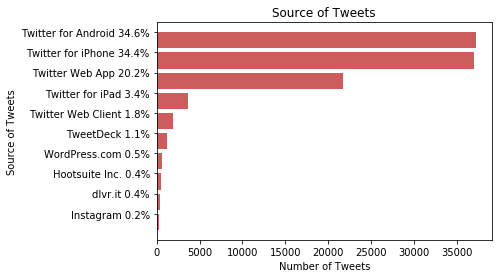

In [12]:
# Find counts by tweet device and make a representative chart
dataset.source_name = dataset.source.apply(get_source_name)

source_counts = dataset.source_name.value_counts().sort_values()[-10:]

bottom = [index for index, item in enumerate(source_counts.index)]
plt.barh(bottom, width=source_counts, color="indianred", linewidth=0)
#sns.barplot(x=bottom, y=dataset.source_name)
y_labels = ["%s %.1f%%" % (item, 100.0*source_counts[item]/len(dataset)) for index,item in enumerate(source_counts.index)]
plt.yticks(np.array(bottom)+0.4, y_labels)
plt.title("Source of Tweets")
plt.xlabel("Number of Tweets")
plt.ylabel("Source of Tweets")
source_counts


## Find mean length of each tweet

In [14]:
dataset["text_length"] = dataset.text.apply(len)
dataset.head()

,created_at,user,geo,coordinates,location,source,retweet_count,is_quote_status,language,text,text_length
0,Fri May 01 20:17:02 +0000 2020,Claudia09507986,None,None,"Maracay, Venezuela","<a href=""http://twitter.com/download/android"" ...",0,False,None,RT @mmcvenaragua: Es necesario el esfuerzo de ...,140
1,Fri May 01 20:19:21 +0000 2020,Qwabiezie,None,None,Citizen of Zion,"<a href=""http://twitter.com/download/android"" ...",0,False,None,RT @GautengProvince: #COVID19 | GAUTENG COVID-...,140
2,Fri May 01 20:21:01 +0000 2020,LawgalUS,None,None,East Coast (Virginia),"<a href=""https://mobile.twitter.com"" rel=""nofo...",0,False,None,COVID-19 coverage is in the news 24-7. Local...,174
3,Fri May 01 20:22:43 +0000 2020,ahm_aff,None,None,Indonesia,"<a href=""http://twitter.com/download/android"" ...",0,False,None,@Dewayangitu Sy sbg warga Jatim jg ngga sepaka...,241
4,Fri May 01 20:22:43 +0000 2020,bayusiradz,None,None,None,"<a href=""http://twitter.com/download/android"" ...",0,False,None,RT @BillGates: There are over 100 different co...,140


In [16]:
mean_length = np.mean(dataset.text_length)
mean_length

135.29051047424403

In [24]:
df['retweeted'].value_counts()

False    107645
Name: retweeted, dtype: int64

In [25]:
df['possibly_sensitive'].value_counts()

False    24200
True       712
Name: possibly_sensitive, dtype: int64

# Save file of tweets to join with other file in original streamer

In [27]:
 pickle.dump( df, open( "save.p", "wb" ) )